In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns

In [2]:
import gc
import joblib
from kdict import kdict
import itertools
import genetools
from pathlib import Path
from slugify import slugify
from typing import Tuple
import genetools
import anndata
import scanpy as sc
from scipy.spatial.distance import pdist, squareform
from genetools.plots import plot_triangular_heatmap
from malid import config, io, helpers
from malid.datamodels import (
    healthy_label,
    GeneLocus,
    TargetObsColumnEnum,
    map_cross_validation_split_strategy_to_default_target_obs_column,
)

In [3]:
# We only support split strategies with default target obs column == TargetObsColumnEnum.disease
# TODO: broaden
assert (
    map_cross_validation_split_strategy_to_default_target_obs_column[
        config.cross_validation_split_strategy
    ]
    == TargetObsColumnEnum.disease
)

In [4]:
def get_dirs(gene_locus: GeneLocus):
    output_dir = (
        config.paths.model_interpretations_for_selected_cross_validation_strategy_output_dir
        / gene_locus.name
    )
    highres_output_dir = (
        config.paths.high_res_outputs_dir_for_cross_validation_strategy
        / "model_interpretations"
        / gene_locus.name
    )

    # Create directories - though these directories should already have been created by sequence model interpretations notebooks
    output_dir.mkdir(parents=True, exist_ok=True)
    highres_output_dir.mkdir(parents=True, exist_ok=True)

    return output_dir, highres_output_dir

# Compute V gene counts overall by disease cohort

Run once. Saved to disk and reloaded by later functions.

In [5]:
def get_vgene_and_cdr3length_counts(
    gene_locus: GeneLocus,
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.Series]:
    fold_labels = ["train_smaller", "validation", "test"]

    specimen_v_gene_counts = []
    specimen_cdr3_length_counts = []
    v_genes_to_keep = pd.Series()
    for fold_id in config.all_fold_ids:
        for fold_label in fold_labels:
            if fold_id == -1 and fold_label == "test":
                # skip: global fold does not have a test set
                continue
            adata = io.load_fold_embeddings(
                fold_id=fold_id,
                fold_label=fold_label,
                gene_locus=gene_locus,
                target_obs_column=TargetObsColumnEnum.disease,
                load_obs_only=True,
            )
            df = adata.obs
            for specimen_label, subset_obs in adata.obs.groupby(
                "specimen_label", observed=True
            ):
                v_gene_counts = (
                    subset_obs["v_gene"].cat.remove_unused_categories().value_counts()
                )
                cdr3_length_counts = subset_obs[
                    "cdr3_aa_sequence_trim_len"
                ].value_counts()
                specimen_description = subset_obs[["specimen_label", "disease"]].iloc[0]
                specimen_v_gene_counts.append(
                    {
                        "fold_id": fold_id,
                        "fold_label": fold_label,
                        **v_gene_counts.to_dict(),
                        **specimen_description.to_dict(),
                    }
                )
                specimen_cdr3_length_counts.append(
                    {
                        "fold_id": fold_id,
                        "fold_label": fold_label,
                        **cdr3_length_counts.to_dict(),
                        **specimen_description.to_dict(),
                    }
                )

            if fold_id == -1 and fold_label == "train_smaller":
                # Save non-rare V genes from global fold training set
                v_genes_to_keep = pd.Series(
                    helpers.find_non_rare_v_genes(adata), name="v_gene"
                )

            del df, adata
            io.clear_cached_fold_embeddings()
            gc.collect()

    specimen_v_gene_counts_df = pd.DataFrame(specimen_v_gene_counts)
    specimen_cdr3_length_counts_df = pd.DataFrame(specimen_cdr3_length_counts)
    return specimen_v_gene_counts_df, specimen_cdr3_length_counts_df, v_genes_to_keep

In [6]:
# export
for gene_locus in config.gene_loci_used:
    # Compute (slow)
    (
        specimen_v_gene_counts_df,
        specimen_cdr3_length_counts_df,
        v_genes_to_keep,
    ) = get_vgene_and_cdr3length_counts(gene_locus=gene_locus)

    # Export
    output_dir, highres_output_dir = get_dirs(gene_locus)
    specimen_v_gene_counts_df.to_csv(
        highres_output_dir / "v_gene_counts_by_specimen.tsv.gz", sep="\t", index=None
    )
    specimen_cdr3_length_counts_df.to_csv(
        highres_output_dir / "cdr3_length_counts_by_specimen.tsv.gz",
        sep="\t",
        index=None,
    )
    v_genes_to_keep.to_csv(output_dir / "meaningful_v_genes.txt", index=None)

{"message": "/tmp/ipykernel_3367766/348203807.py:8: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.\n  v_genes_to_keep = pd.Series()\n", "time": "2024-02-07T08:09:28.892514"}


{"message": "/tmp/ipykernel_3367766/348203807.py:8: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.\n  v_genes_to_keep = pd.Series()\n", "time": "2024-02-07T08:37:54.412344"}


# Analyze V gene counts and CDR3 length distribution

In [7]:
# reimport (can resume here)
def import_v_gene_counts(gene_locus: GeneLocus):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    specimen_v_gene_counts_df = pd.read_csv(
        highres_output_dir / "v_gene_counts_by_specimen.tsv.gz", sep="\t"
    )

    # subselect to test folds only (which also excludes global fold -1), and set index
    specimen_v_gene_counts_df_test_only = specimen_v_gene_counts_df[
        specimen_v_gene_counts_df["fold_label"] == "test"
    ]

    # confirm only one entry per specimen now
    assert not specimen_v_gene_counts_df_test_only["specimen_label"].duplicated().any()
    specimen_v_gene_counts_df_test_only = specimen_v_gene_counts_df_test_only.set_index(
        "specimen_label"
    ).drop(["fold_id", "fold_label"], axis=1)

    # fill na
    specimen_v_gene_counts_df_test_only = specimen_v_gene_counts_df_test_only.fillna(0)

    v_gene_cols = specimen_v_gene_counts_df_test_only.columns
    v_gene_cols = v_gene_cols[~v_gene_cols.isin(["disease"])]

    # get filtered subset of v_gene_cols
    v_gene_cols_filtered = pd.read_csv(output_dir / "meaningful_v_genes.txt")[
        "v_gene"
    ].values
    assert all(vgene in v_gene_cols for vgene in v_gene_cols_filtered)  # sanity check

    return specimen_v_gene_counts_df_test_only, v_gene_cols, v_gene_cols_filtered

In [8]:
def import_cdr3_length_counts(gene_locus: GeneLocus):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    specimen_cdr3_length_counts_df = pd.read_csv(
        highres_output_dir / "cdr3_length_counts_by_specimen.tsv.gz", sep="\t"
    )

    # subselect to test folds only (which also excludes global fold -1), and set index
    specimen_cdr3_length_counts_df_test_only = specimen_cdr3_length_counts_df[
        specimen_cdr3_length_counts_df["fold_label"] == "test"
    ]

    # confirm only one entry per specimen now
    assert (
        not specimen_cdr3_length_counts_df_test_only["specimen_label"]
        .duplicated()
        .any()
    )
    specimen_cdr3_length_counts_df_test_only = (
        specimen_cdr3_length_counts_df_test_only.set_index("specimen_label").drop(
            ["fold_id", "fold_label"], axis=1
        )
    )

    # drop any columns that are all N/A
    specimen_cdr3_length_counts_df_test_only = (
        specimen_cdr3_length_counts_df_test_only.dropna(axis=1, how="all")
    )

    # fill remaining N/As with 0
    specimen_cdr3_length_counts_df_test_only = (
        specimen_cdr3_length_counts_df_test_only.fillna(0)
    )

    cdr3_length_cols = specimen_cdr3_length_counts_df_test_only.columns
    cdr3_length_cols = cdr3_length_cols[~cdr3_length_cols.isin(["disease"])]

    # Convert cols to ints
    specimen_cdr3_length_counts_df_test_only.rename(
        columns={i: int(i) for i in cdr3_length_cols}, inplace=True
    )
    # Get latest column list
    cdr3_length_cols = specimen_cdr3_length_counts_df_test_only.columns
    cdr3_length_cols = cdr3_length_cols[~cdr3_length_cols.isin(["disease"])]

    # Fill in skips as all 0s
    for cdr3_len in np.arange(min(cdr3_length_cols), max(cdr3_length_cols)):
        if cdr3_len not in cdr3_length_cols:
            specimen_cdr3_length_counts_df_test_only[cdr3_len] = 0.0

    # Get latest column list
    cdr3_length_cols = specimen_cdr3_length_counts_df_test_only.columns
    cdr3_length_cols = cdr3_length_cols[~cdr3_length_cols.isin(["disease"])]

    return specimen_cdr3_length_counts_df_test_only, cdr3_length_cols

# For specimens of each disease type, plot average (+/- std) of V gene proportions and CDR3 length distributions

In [9]:
def analyze_v_gene_proportions(gene_locus: GeneLocus):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    (
        specimen_v_gene_counts_df_test_only,
        v_gene_cols,
        v_gene_cols_filtered,
    ) = import_v_gene_counts(gene_locus=gene_locus)

    # Get V gene usage proportions per specimen
    v_gene_usage_proportions_by_specimen = pd.concat(
        [
            genetools.stats.normalize_rows(
                specimen_v_gene_counts_df_test_only[v_gene_cols]
            ),
            specimen_v_gene_counts_df_test_only["disease"],
        ],
        axis=1,
    )

    v_gene_usage_proportions_by_specimen_melt = pd.melt(
        v_gene_usage_proportions_by_specimen,
        id_vars=["disease"],
        value_vars=v_gene_cols,
        var_name="V gene",
        value_name="Proportion",
    )

    def plot(v_gene_usage_proportions_by_specimen_melt, filtered=False):
        height = 7 if filtered else 13
        selected_v_gene_order = pd.Series(
            v_gene_cols_filtered if filtered else v_gene_cols
        )

        diseases = sorted(v_gene_usage_proportions_by_specimen_melt["disease"].unique())

        fig, axarr = plt.subplots(
            nrows=1,
            ncols=len(diseases),
            figsize=(3 * len(diseases), height),
            sharex=True,  # Make xlims consistent for better readability
            sharey=False,  # Repeat the V gene in each axis for better readability
        )
        for (disease, ax) in zip(diseases, axarr):
            data = v_gene_usage_proportions_by_specimen_melt[
                v_gene_usage_proportions_by_specimen_melt["disease"] == disease
            ]
            sns.barplot(
                # Switch to friendly V gene names
                data=data.assign(
                    **{"V gene": data["V gene"].replace(helpers.v_gene_friendly_names)}
                ),
                x="Proportion",
                y="V gene",
                # reference V gene order, possibly filtered down
                order=helpers.v_gene_sort(
                    selected_v_gene_order.replace(helpers.v_gene_friendly_names)
                ),
                ax=ax,
                color=helpers.disease_color_palette[disease],
                # Compute 95% confidence intervals around a sample mean by bootstrapping:
                # sampling distribution of mean generated by repeated sampling and recording mean each time.
                # the standard error is basically the standard deviation of many sample means
                # we plot mean +/- 1.96*standard error. gives you average value +/- X at the 95% confidence level.
                errorbar=("ci", 95),
                # errorbar="sd", # instead draw the standard deviation of the observations, instead of bootstrapping to get 95% confidence intervals
                # capsize=.025
            )

            ax.set_title(disease, fontweight="bold")
            ax.set_xlabel(
                "Proportion of specimen\n(mean +/- 95% confidence interval)",
                fontsize="small",
            )
            ax.set_ylabel(None)
            sns.despine(ax=ax)

        axarr[0].set_ylabel("V gene")
        plt.tight_layout()
        return fig

    ## Plot for all V genes
    fig = plot(
        v_gene_usage_proportions_by_specimen_melt=v_gene_usage_proportions_by_specimen_melt,
        filtered=False,
    )
    genetools.plots.savefig(
        fig,
        highres_output_dir / "v_gene_proportions_by_specimen.by_disease.png",
        dpi=300,
    )

    ## Repeat, for subset of V genes
    fig = plot(
        v_gene_usage_proportions_by_specimen_melt=v_gene_usage_proportions_by_specimen_melt,
        filtered=True,
    )
    genetools.plots.savefig(
        fig,
        highres_output_dir
        / "v_gene_proportions_by_specimen.filtered_v_genes.by_disease.png",
        dpi=300,
    )

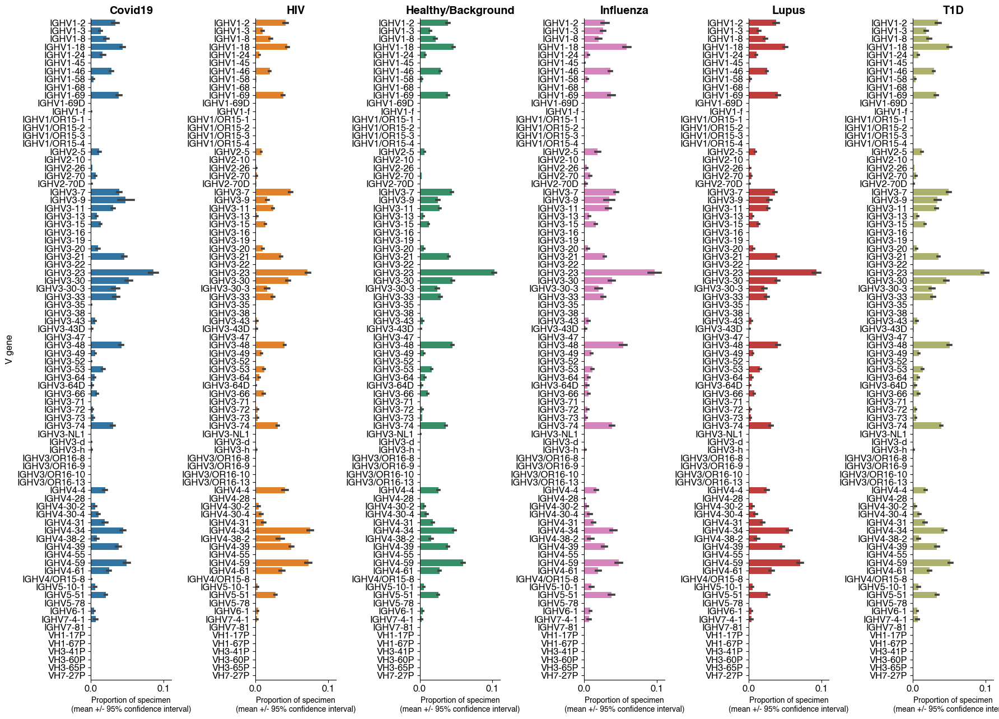

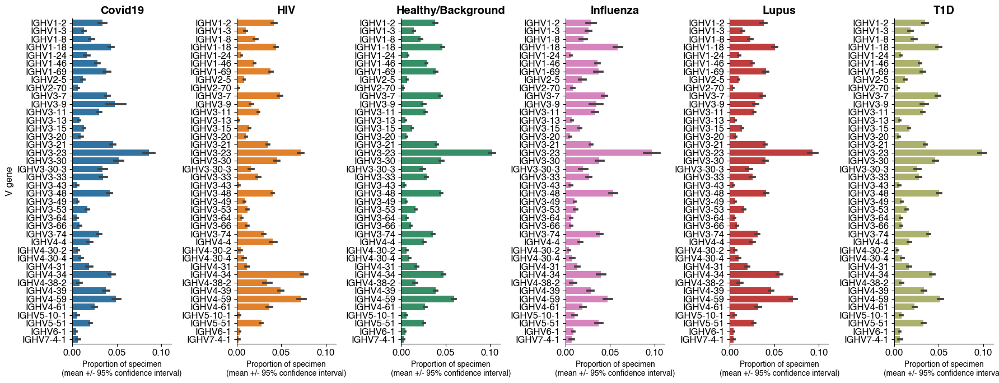

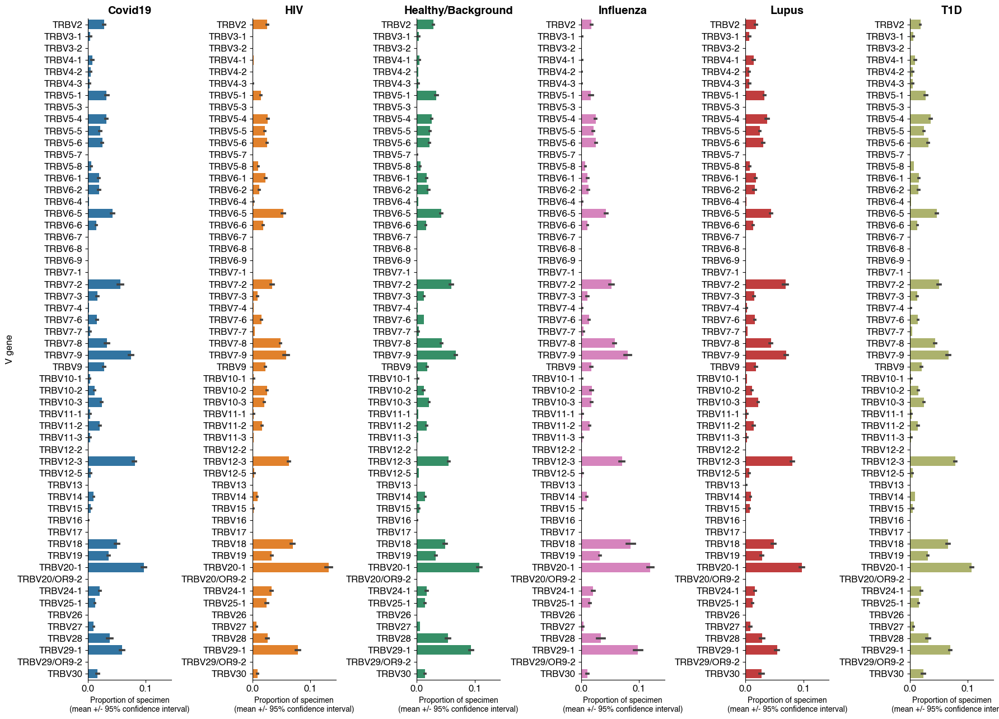

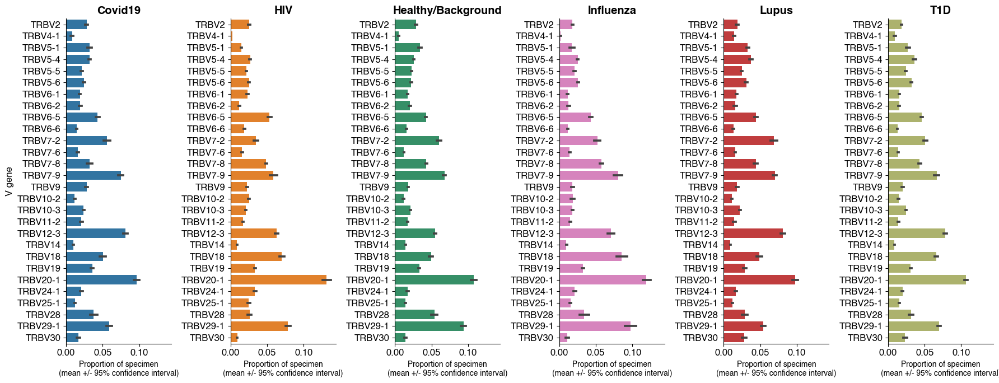

In [10]:
for gene_locus in config.gene_loci_used:
    analyze_v_gene_proportions(gene_locus)

In [11]:
def analyze_cdr3_length_distribution(gene_locus: GeneLocus):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    (
        specimen_cdr3_length_counts_df_test_only,
        cdr3_length_cols,
    ) = import_cdr3_length_counts(gene_locus=gene_locus)

    # Get CDR3 length usage distribution per specimen
    cdr3_length_distribution_by_specimen = pd.concat(
        [
            genetools.stats.normalize_rows(
                specimen_cdr3_length_counts_df_test_only[cdr3_length_cols]
            ),
            specimen_cdr3_length_counts_df_test_only["disease"],
        ],
        axis=1,
    )

    cdr3_length_distribution_by_specimen_melt = pd.melt(
        cdr3_length_distribution_by_specimen,
        id_vars=["disease"],
        value_vars=cdr3_length_cols,
        var_name="CDR3 length",
        value_name="Proportion",
    )

    # Not necessary, but let's cast from object to int:
    cdr3_length_distribution_by_specimen_melt[
        "CDR3 length"
    ] = cdr3_length_distribution_by_specimen_melt["CDR3 length"].astype(int)

    def plot(cdr3_length_distribution_by_specimen_melt, filtered=False):
        height = 7 if filtered else 13
        diseases = sorted(cdr3_length_distribution_by_specimen_melt["disease"].unique())

        fig, axarr = plt.subplots(
            nrows=1,
            ncols=len(diseases),
            figsize=(3 * len(diseases), height),
            sharex=True,  # Make xlims consistent for better readability
            sharey=False,  # Repeat the V gene in each axis for better readability
        )
        for (disease, ax) in zip(diseases, axarr):
            sns.barplot(
                data=cdr3_length_distribution_by_specimen_melt[
                    cdr3_length_distribution_by_specimen_melt["disease"] == disease
                ],
                x="Proportion",
                y="CDR3 length",
                orient="h",
                order=list(reversed(sorted(cdr3_length_cols))),
                ax=ax,
                color=helpers.disease_color_palette[disease],
                # Compute 95% confidence intervals around a sample mean by bootstrapping:
                # sampling distribution of mean generated by repeated sampling and recording mean each time.
                # the standard error is basically the standard deviation of many sample means
                # we plot mean +/- 1.96*standard error. gives you average value +/- X at the 95% confidence level.
                errorbar=("ci", 95),
                # errorbar="sd", # instead draw the standard deviation of the observations, instead of bootstrapping to get 95% confidence intervals
                # capsize=.025
            )

            ax.set_title(disease, fontweight="bold")
            ax.set_xlabel(
                "Proportion of specimen\n(mean +/- 95% confidence interval)",
                fontsize="small",
            )
            ax.set_ylabel(None)
            sns.despine(ax=ax)

        axarr[0].set_ylabel(f"CDR3 length ({gene_locus})")
        plt.tight_layout()
        return fig

    ## Plot
    fig = plot(
        cdr3_length_distribution_by_specimen_melt=cdr3_length_distribution_by_specimen_melt,
        filtered=False,
    )


#     genetools.plots.savefig(
#         fig,
#         highres_output_dir / "v_gene_proportions_by_specimen.by_disease.png",
#         dpi=300,
#     )

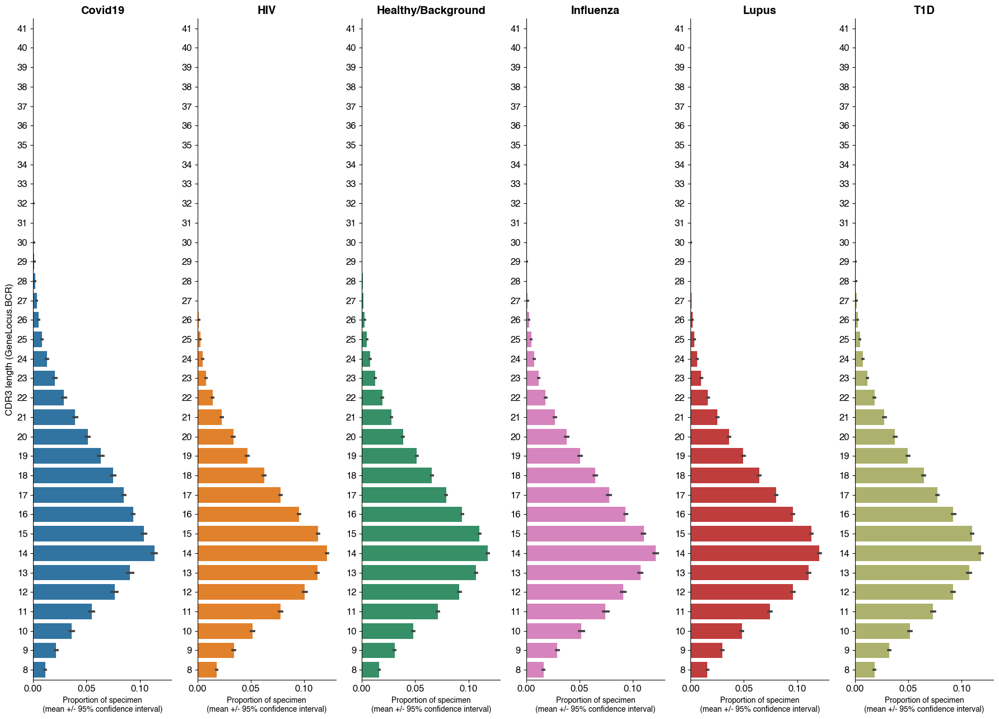

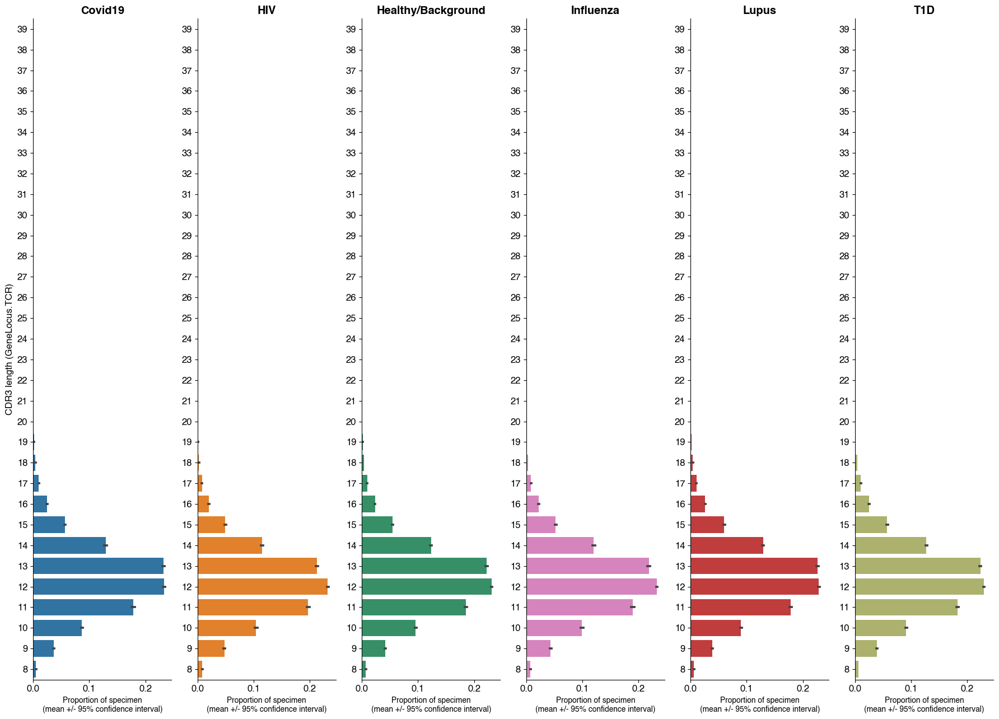

In [12]:
for gene_locus in config.gene_loci_used:
    analyze_cdr3_length_distribution(gene_locus)

## Same but now versus ancestry

Covid19 and Healthy cohorts have many ancestry groups represented

In [13]:
extra_specimen_metadata = helpers.get_all_specimen_info()
extra_specimen_metadata = extra_specimen_metadata[
    extra_specimen_metadata["in_training_set"]
].copy()

extra_specimen_metadata

,participant_label,specimen_label,disease,specimen_time_point,participant_description,data_source,study_name,available_gene_loci,disease_subtype,age,...,symptoms_response_by_week_12_binarized,symptoms_treatment_arm,specimen_time_point_days,survived_filters,is_selected_for_cv_strategy,in_training_set,past_exposure,disease.separate_past_exposures,disease.rollup,test_fold_id
0,BFI-0000234,M124-S014,Healthy/Background,NaN,Location: USA,DataSource.in_house,HIV,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",Healthy/Background - HIV Negative,27.0,...,NaN,NaN,NaN,True,True,True,False,Healthy/Background,Healthy/Background,1.0
2,BFI-0002850,M124-S042,Healthy/Background,NaN,Location: USA,DataSource.in_house,HIV,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",Healthy/Background - HIV Negative,26.0,...,NaN,NaN,NaN,True,True,True,False,Healthy/Background,Healthy/Background,0.0
4,BFI-0002851,M124-S041,Healthy/Background,NaN,Location: USA,DataSource.in_house,HIV,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",Healthy/Background - HIV Negative,27.0,...,NaN,NaN,NaN,True,True,True,False,Healthy/Background,Healthy/Background,2.0
6,BFI-0002852,M124-S012,Healthy/Background,NaN,Location: USA,DataSource.in_house,HIV,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",Healthy/Background - HIV Negative,26.0,...,NaN,NaN,NaN,True,True,True,False,Healthy/Background,Healthy/Background,1.0
8,BFI-0002861,M124-S037,Healthy/Background,NaN,Location: Malawi,DataSource.in_house,HIV,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",Healthy/Background - HIV Negative,34.0,...,NaN,NaN,NaN,True,True,True,False,Healthy/Background,Healthy/Background,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2336,BFI-0010791,M491-S149,T1D,NaN,Diabetes 35453-study biobank: pediatric; T1D +...,DataSource.in_house,Diabetes biobank,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",T1D - pediatric,NaN,...,NaN,NaN,NaN,True,True,True,False,T1D,T1D,0.0
2337,BFI-0010792,M491-S150,T1D,NaN,Diabetes 35453-study biobank: adult; TID,DataSource.in_house,Diabetes biobank,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",T1D - adult,NaN,...,NaN,NaN,NaN,True,True,True,False,T1D,T1D,1.0
2338,BFI-0010794,M491-S153,T1D,NaN,Diabetes 35453-study biobank: pediatric; TID,DataSource.in_house,Diabetes biobank,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",T1D - pediatric,NaN,...,NaN,NaN,NaN,True,True,True,False,T1D,T1D,0.0
2339,BFI-0010800,M491-S160,T1D,NaN,Diabetes 35453-study biobank: pediatric; T1D,DataSource.in_house,Diabetes biobank,"(((GeneLocus.BCR)), ((GeneLocus.TCR)))",T1D - pediatric,NaN,...,NaN,NaN,NaN,True,True,True,False,T1D,T1D,0.0


In [14]:
extra_specimen_metadata["disease_subtype"].value_counts()

T1D - pediatric                                       67
Healthy/Background - CMV-                             53
HIV Non Neutralizing                                  53
Healthy/Background - CMV+                             48
HIV Broad Neutralizing                                45
Healthy/Background - HIV Negative                     43
Healthy/Background (children)                         43
Influenza vaccine 2021 - day 7                        37
Covid19 - Admit                                       33
T1D - adult                                           29
Healthy/Background - SLE Negative                     27
Pediatric SLE - nephritis                             23
SLE Patient                                           21
Pediatric SLE - no nephritis                          20
Covid19 - ICU                                         15
SLE Multiple aAbs / SLE dsDNA WITHOUT Nephritis        9
SLE Multiple aAbs / SLE dsDNA WITH Nephritis           9
SLE Multiple aAbs              

In [15]:
extra_specimen_metadata["study_name"].value_counts()

HIV                                                     141
Diabetes biobank                                         99
Healthy-StanfordBloodCenter                              72
Lupus                                                    61
Covid19-Stanford                                         48
healthy_children                                         43
Lupus Pediatric                                          43
Flu vaccine UPenn 2021                                   37
Healthy-StanfordBloodCenter_included-in-resequencing     30
New Lupus RNA                                            20
Covid19-buffycoat                                        10
New Lupus Paxgene                                         7
Covid19-Seattle                                           5
Name: study_name, dtype: int64

In [16]:
extra_specimen_metadata["disease_severity"].value_counts()

Admit           36
Nephritis       33
No nephritis    32
ICU             22
Name: disease_severity, dtype: int64

In [17]:
extra_specimen_metadata.groupby(["study_name", "disease_severity"]).size()

study_name         disease_severity
Covid19-Stanford   Admit               33
                   ICU                 15
Covid19-buffycoat  Admit                3
                   ICU                  7
Lupus              Nephritis           10
                   No nephritis        12
Lupus Pediatric    Nephritis           23
                   No nephritis        20
dtype: int64

In [18]:
def analyze_v_gene_proportions_by_subgroup(gene_locus: GeneLocus, group_key: str):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    (
        specimen_v_gene_counts_df_test_only,
        v_gene_cols,
        v_gene_cols_filtered,
    ) = import_v_gene_counts(gene_locus=gene_locus)

    # Get V gene usage proportions per specimen
    v_gene_usage_proportions_by_specimen = pd.concat(
        [
            genetools.stats.normalize_rows(
                specimen_v_gene_counts_df_test_only[v_gene_cols]
            ),
            specimen_v_gene_counts_df_test_only["disease"],
        ],
        axis=1,
    )

    v_gene_usage_proportions_by_specimen_annot = genetools.helpers.merge_into_left(
        v_gene_usage_proportions_by_specimen[v_gene_cols],
        extra_specimen_metadata.set_index("specimen_label"),
    )
    assert (
        v_gene_usage_proportions_by_specimen_annot.shape[0]
        == v_gene_usage_proportions_by_specimen.shape[0]
    )
    assert not v_gene_usage_proportions_by_specimen_annot["disease"].isna().any()

    # drop specimens with group N/A
    v_gene_usage_proportions_by_specimen_annot = (
        v_gene_usage_proportions_by_specimen_annot.dropna(subset=[group_key])
    )

    v_gene_usage_proportions_by_specimen_annot_melt = pd.melt(
        v_gene_usage_proportions_by_specimen_annot,
        id_vars=["disease", group_key],
        value_vars=v_gene_cols,
        var_name="V gene",
        value_name="Proportion",
    )

    group_color_palette = {
        group: color
        for group, color in zip(
            sorted(v_gene_usage_proportions_by_specimen_annot_melt[group_key].unique()),
            sc.plotting.palettes.default_20,
        )
    }

    def plot_per_disease(
        v_gene_usage_proportions_by_specimen_annot_melt: pd.DataFrame,
        disease: str,
        filtered=False,
    ):
        height = 7 if filtered else 13
        selected_v_gene_order = pd.Series(
            v_gene_cols_filtered if filtered else v_gene_cols
        )

        v_gene_usage_proportions_by_specimen_annot_melt_this_disease = (
            v_gene_usage_proportions_by_specimen_annot_melt[
                v_gene_usage_proportions_by_specimen_annot_melt["disease"] == disease
            ]
        )
        # Sort for consistent group order
        groups_this_disease = sorted(
            v_gene_usage_proportions_by_specimen_annot_melt_this_disease[
                group_key
            ].unique()
        )
        if len(groups_this_disease) == 0:
            print(f"No {group_key} group info for {disease} - skipping")
            return None

        # Divide the disease plot into subplots by group
        fig, axarr = plt.subplots(
            nrows=1,
            ncols=len(groups_this_disease),
            figsize=(3 * len(groups_this_disease), height),
            sharex=True,  # Make xlims consistent for better readability
            sharey=False,  # Repeat the V gene in each axis for better readability
        )
        axarr = np.atleast_1d(axarr)  # edge case: wrap single axis in array
        for (group, ax) in zip(groups_this_disease, axarr):
            data = v_gene_usage_proportions_by_specimen_annot_melt_this_disease[
                v_gene_usage_proportions_by_specimen_annot_melt_this_disease[group_key]
                == group
            ]
            sns.barplot(
                # Switch to friendly V gene names
                data=data.assign(
                    **{"V gene": data["V gene"].replace(helpers.v_gene_friendly_names)}
                ),
                x="Proportion",
                y="V gene",
                # reference V gene order, possibly filtered down
                order=helpers.v_gene_sort(
                    selected_v_gene_order.replace(helpers.v_gene_friendly_names)
                ),
                ax=ax,
                color=group_color_palette[group],
                # Compute 95% confidence intervals around a sample mean by bootstrapping:
                # sampling distribution of mean generated by repeated sampling and recording mean each time.
                # the standard error is basically the standard deviation of many sample means
                # we plot mean +/- 1.96*standard error. gives you average value +/- X at the 95% confidence level.
                errorbar=("ci", 95),
                # errorbar="sd", # instead draw the standard deviation of the observations, instead of bootstrapping to get 95% confidence intervals
                # capsize=.025
            )

            # compute sample size per disease and group, using dataframe from before melting but after N/As were dropped
            sample_size = v_gene_usage_proportions_by_specimen_annot[
                (v_gene_usage_proportions_by_specimen_annot["disease"] == disease)
                & (v_gene_usage_proportions_by_specimen_annot[group_key] == group)
            ].shape[0]

            ax.set_title(f"{group} $(n={sample_size})$", fontweight="bold")
            ax.set_xlabel(
                "Proportion of specimen\n(mean +/- 95% confidence interval)",
                fontsize="small",
            )
            ax.set_ylabel(None)
            sns.despine(ax=ax)

        axarr[0].set_ylabel("V gene")
        fig.suptitle(f"{disease} ({gene_locus})", fontsize="x-large", fontweight="bold")
        plt.tight_layout()
        return fig

    # Make a plot for each disease
    for disease in ["Covid19", "Lupus", healthy_label]:
        # Plot for all V genes
        fig = plot_per_disease(
            v_gene_usage_proportions_by_specimen_annot_melt=v_gene_usage_proportions_by_specimen_annot_melt,
            disease=disease,
            filtered=False,
        )
        if fig is not None:
            genetools.plots.savefig(
                fig,
                highres_output_dir
                / f"v_gene_proportions_by_specimen.disease.{slugify(disease)}.by_{group_key}.png",
                dpi=300,
            )

        # Repeat, for subset of V genes
        fig = plot_per_disease(
            v_gene_usage_proportions_by_specimen_annot_melt=v_gene_usage_proportions_by_specimen_annot_melt,
            disease=disease,
            filtered=True,
        )
        if fig is not None:
            genetools.plots.savefig(
                fig,
                output_dir
                / f"v_gene_proportions_by_specimen.filtered_v_genes.disease.{slugify(disease)}.by_{group_key}.png",
                dpi=300,
            )

    return v_gene_usage_proportions_by_specimen_annot_melt

In [19]:
def analyze_cdr3_length_distribution_by_subgroup(gene_locus: GeneLocus, group_key: str):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    (
        specimen_cdr3_length_counts_df_test_only,
        cdr3_length_cols,
    ) = import_cdr3_length_counts(gene_locus=gene_locus)

    # Get CDR3 length usage distribution per specimen
    cdr3_length_distribution_by_specimen = pd.concat(
        [
            genetools.stats.normalize_rows(
                specimen_cdr3_length_counts_df_test_only[cdr3_length_cols]
            ),
            specimen_cdr3_length_counts_df_test_only["disease"],
        ],
        axis=1,
    )

    cdr3_length_distribution_by_specimen_annot = genetools.helpers.merge_into_left(
        cdr3_length_distribution_by_specimen[cdr3_length_cols],
        extra_specimen_metadata.set_index("specimen_label"),
    )
    assert (
        cdr3_length_distribution_by_specimen_annot.shape[0]
        == cdr3_length_distribution_by_specimen.shape[0]
    )
    assert not cdr3_length_distribution_by_specimen_annot["disease"].isna().any()

    # drop specimens with group N/A
    cdr3_length_distribution_by_specimen_annot = (
        cdr3_length_distribution_by_specimen_annot.dropna(subset=[group_key])
    )

    cdr3_length_distribution_by_specimen_annot_melt = pd.melt(
        cdr3_length_distribution_by_specimen_annot,
        id_vars=["disease", group_key],
        value_vars=cdr3_length_cols,
        var_name="CDR3 length",
        value_name="Proportion",
    )
    # Not necessary, but let's cast from object to int:
    cdr3_length_distribution_by_specimen_annot_melt[
        "CDR3 length"
    ] = cdr3_length_distribution_by_specimen_annot_melt["CDR3 length"].astype(int)

    group_color_palette = {
        group: color
        for group, color in zip(
            sorted(cdr3_length_distribution_by_specimen_annot_melt[group_key].unique()),
            sc.plotting.palettes.default_20,
        )
    }

    def plot_per_disease(
        cdr3_length_distribution_by_specimen_annot_melt: pd.DataFrame,
        disease: str,
        filtered=False,
    ):
        height = 7 if filtered else 13
        cdr3_length_distribution_by_specimen_annot_melt_this_disease = (
            cdr3_length_distribution_by_specimen_annot_melt[
                cdr3_length_distribution_by_specimen_annot_melt["disease"] == disease
            ]
        )
        # Sort for consistent group order
        groups_this_disease = sorted(
            cdr3_length_distribution_by_specimen_annot_melt_this_disease[
                group_key
            ].unique()
        )
        if len(groups_this_disease) == 0:
            print(f"No {group_key} group info for {disease} - skipping")
            return None

        # Divide the disease plot into subplots by group
        fig, axarr = plt.subplots(
            nrows=1,
            ncols=len(groups_this_disease),
            figsize=(3 * len(groups_this_disease), height),
            sharex=True,  # Make xlims consistent for better readability
            sharey=False,  # Repeat the V gene in each axis for better readability
        )
        axarr = np.atleast_1d(axarr)  # edge case: wrap single axis in array
        for (group, ax) in zip(groups_this_disease, axarr):
            sns.barplot(
                data=cdr3_length_distribution_by_specimen_annot_melt_this_disease[
                    cdr3_length_distribution_by_specimen_annot_melt_this_disease[
                        group_key
                    ]
                    == group
                ],
                x="Proportion",
                y="CDR3 length",
                orient="h",
                order=list(reversed(sorted(cdr3_length_cols))),
                ax=ax,
                color=group_color_palette[group],
                # Compute 95% confidence intervals around a sample mean by bootstrapping:
                # sampling distribution of mean generated by repeated sampling and recording mean each time.
                # the standard error is basically the standard deviation of many sample means
                # we plot mean +/- 1.96*standard error. gives you average value +/- X at the 95% confidence level.
                errorbar=("ci", 95),
                # errorbar="sd", # instead draw the standard deviation of the observations, instead of bootstrapping to get 95% confidence intervals
                # capsize=.025
            )

            # compute sample size per disease and group, using dataframe from before melting but after N/As were dropped
            sample_size = cdr3_length_distribution_by_specimen_annot[
                (cdr3_length_distribution_by_specimen_annot["disease"] == disease)
                & (cdr3_length_distribution_by_specimen_annot[group_key] == group)
            ].shape[0]

            ax.set_title(f"{group} $(n={sample_size})$", fontweight="bold")
            ax.set_xlabel(
                "Proportion of specimen\n(mean +/- 95% confidence interval)",
                fontsize="small",
            )
            ax.set_ylabel(None)
            sns.despine(ax=ax)

        axarr[0].set_ylabel("CDR3 length")
        fig.suptitle(f"{disease} ({gene_locus})", fontsize="x-large", fontweight="bold")
        plt.tight_layout()
        return fig

    # Make a plot for each disease
    for disease in ["Covid19", "Lupus", healthy_label]:
        # Plot for all V genes
        fig = plot_per_disease(
            cdr3_length_distribution_by_specimen_annot_melt=cdr3_length_distribution_by_specimen_annot_melt,
            disease=disease,
            filtered=False,
        )
    #         if fig is not None:
    #             genetools.plots.savefig(
    #                 fig,
    #                 highres_output_dir
    #                 / f"v_gene_proportions_by_specimen.disease.{slugify(disease)}.by_{group_key}.png",
    #                 dpi=300,
    #             )

    return cdr3_length_distribution_by_specimen_annot_melt

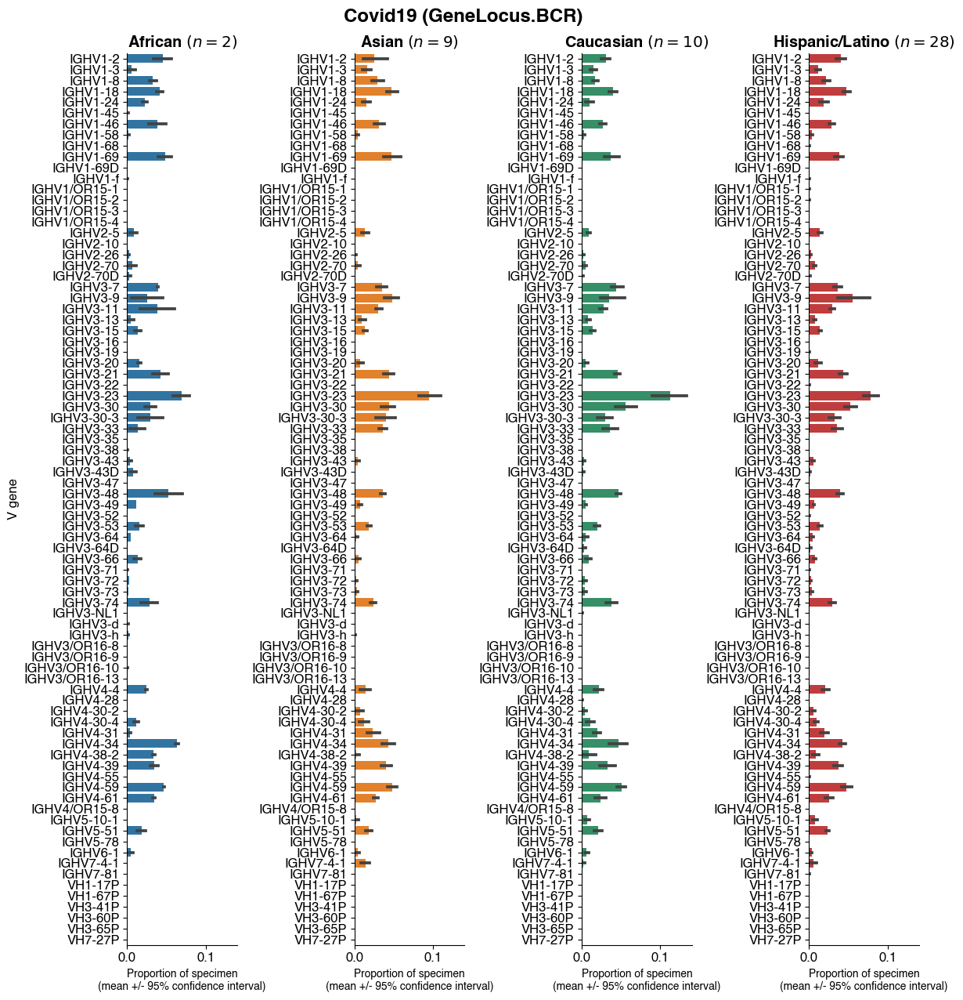

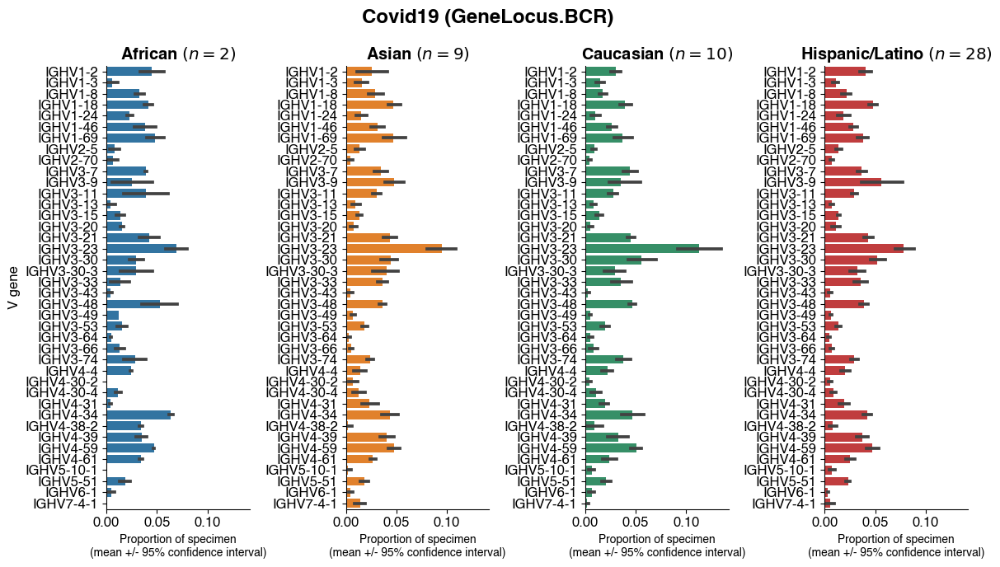

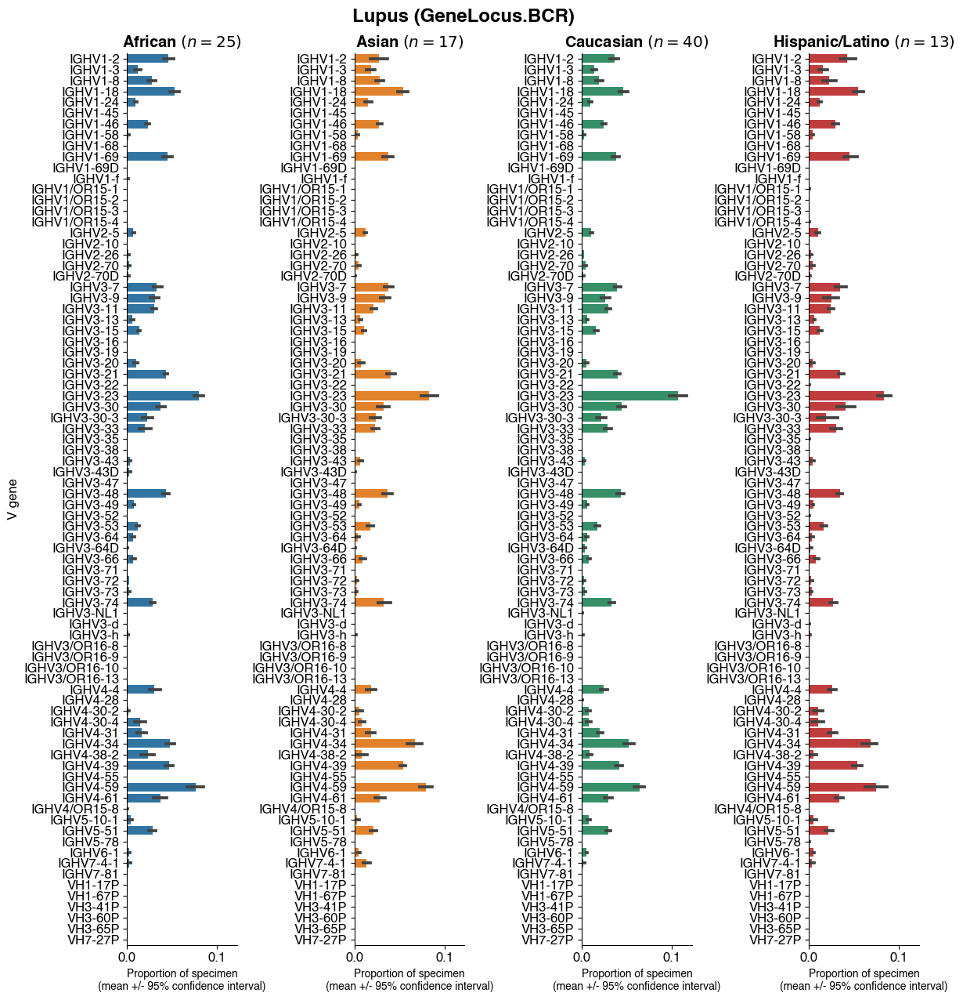

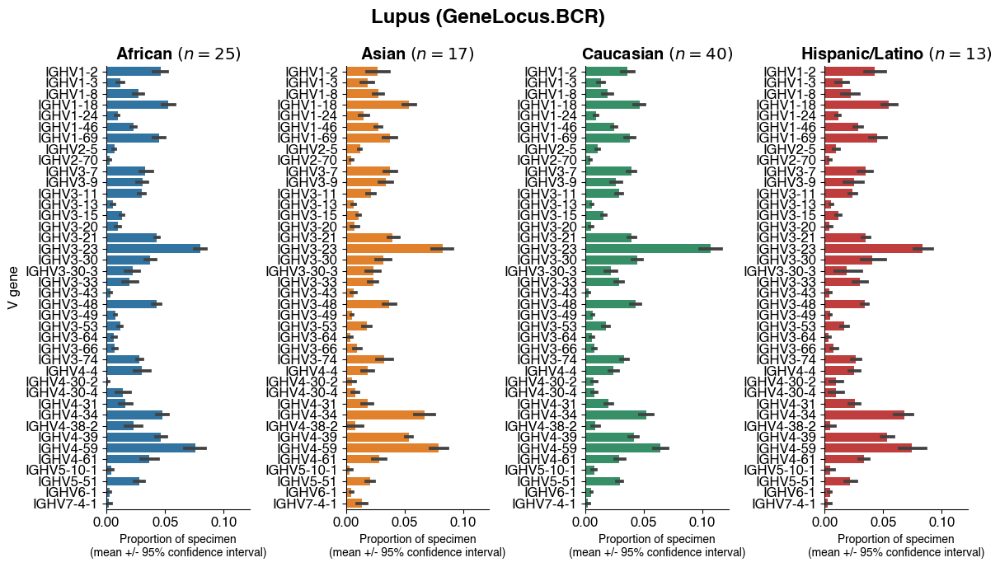

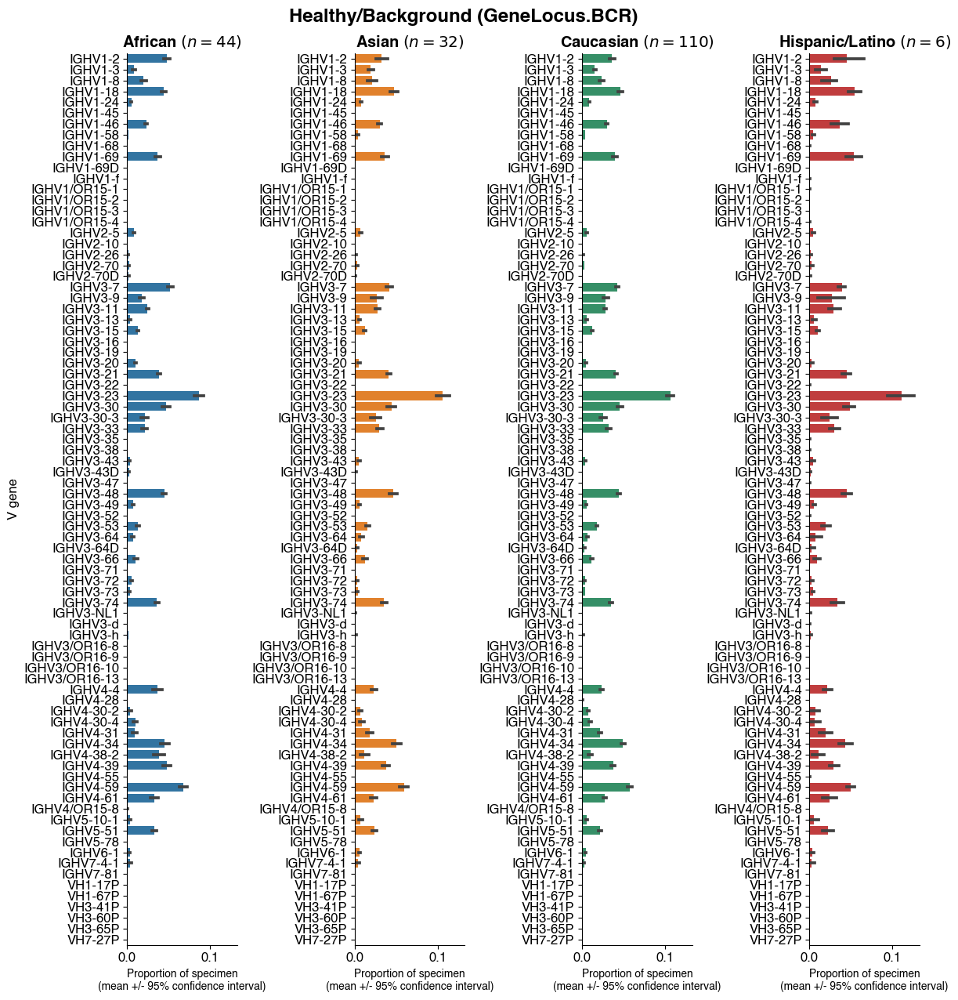

...

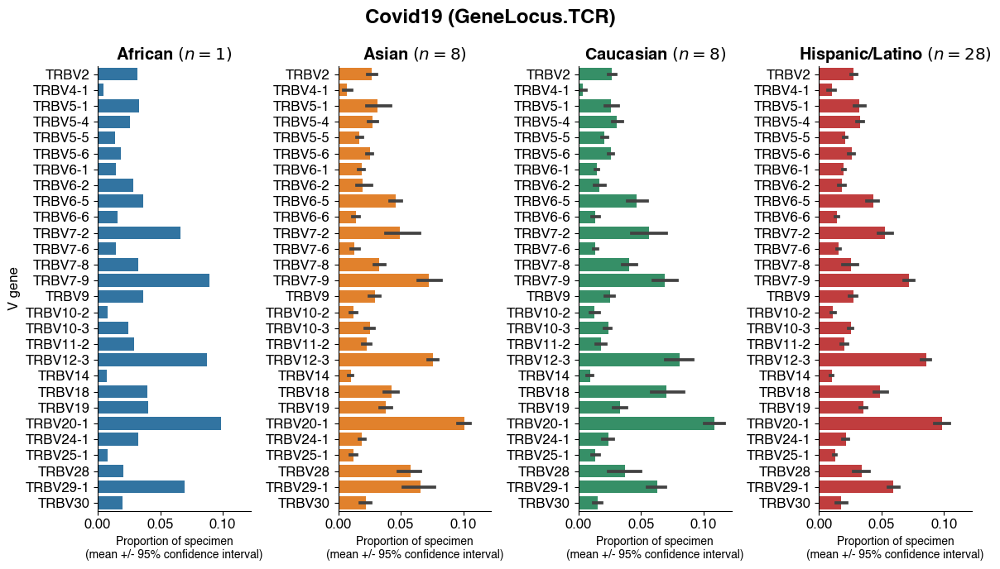

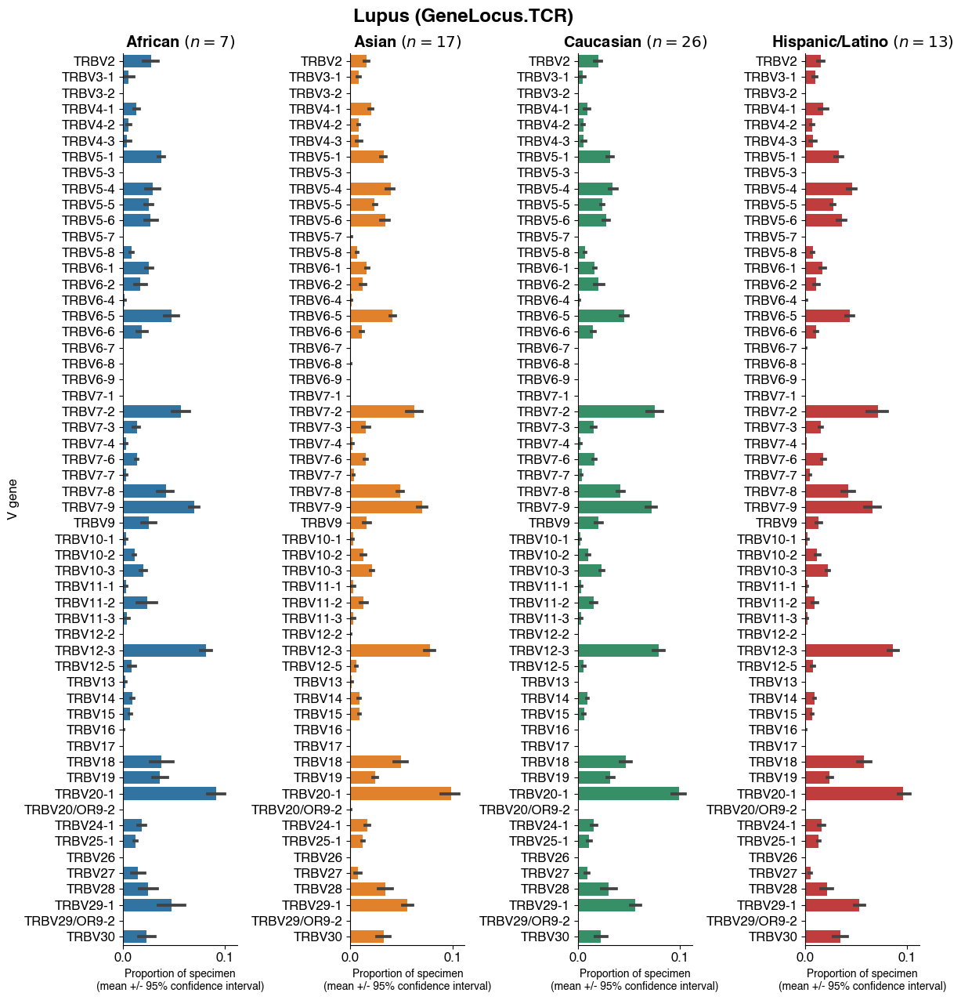

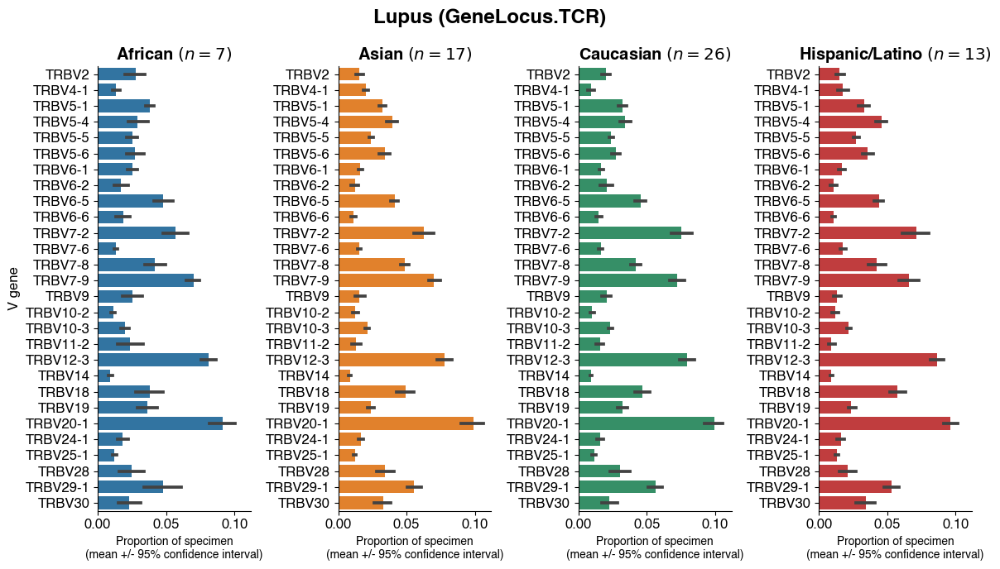

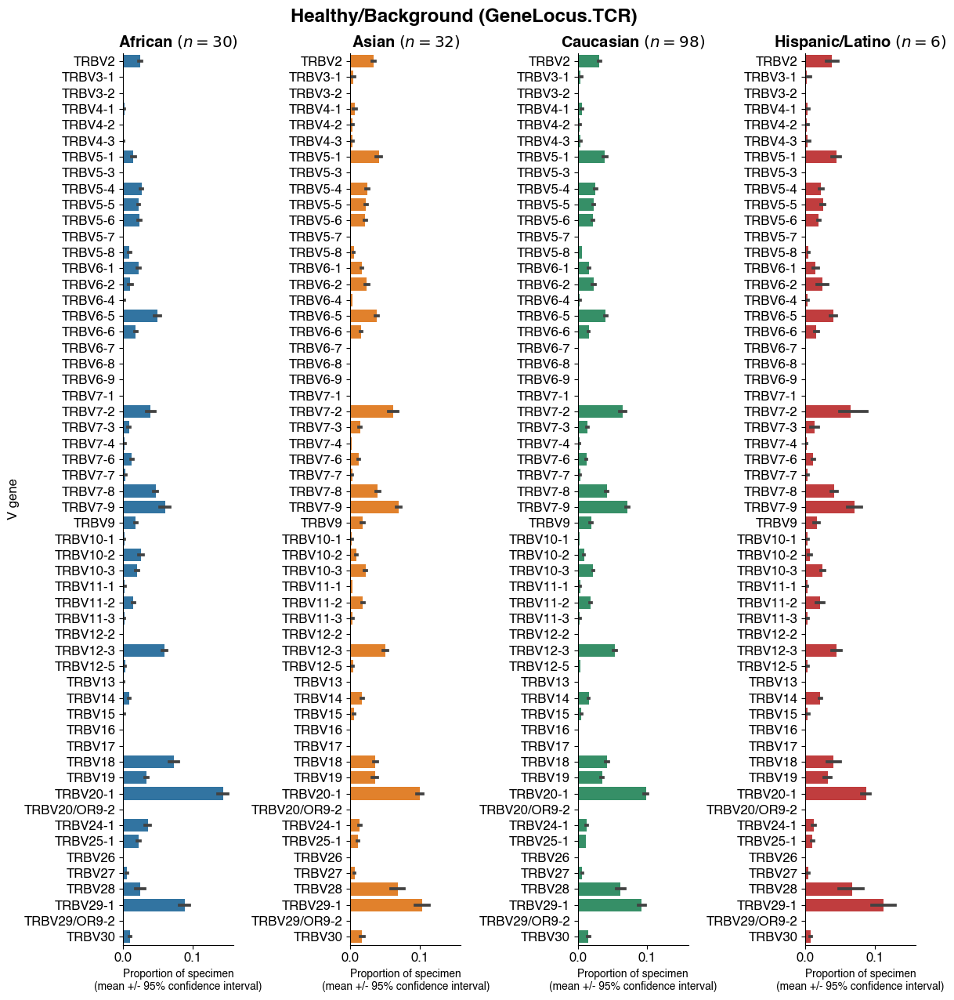

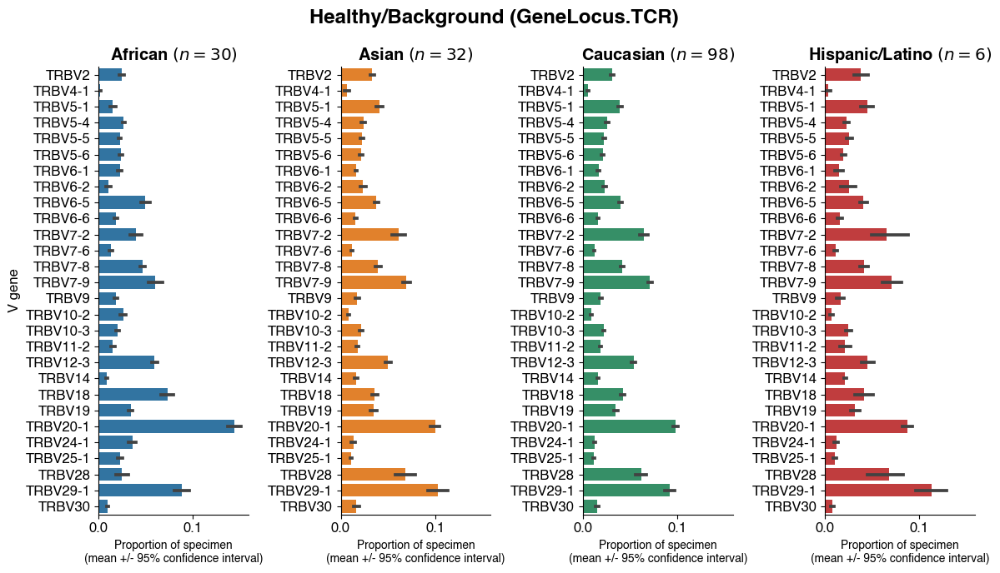

In [20]:
v_gene_use_proportions_by_specimen_and_ethnicity = {}
for gene_locus in config.gene_loci_used:
    v_gene_use_proportions_by_specimen_and_ethnicity[
        gene_locus
    ] = analyze_v_gene_proportions_by_subgroup(
        gene_locus, group_key="ethnicity_condensed"
    )

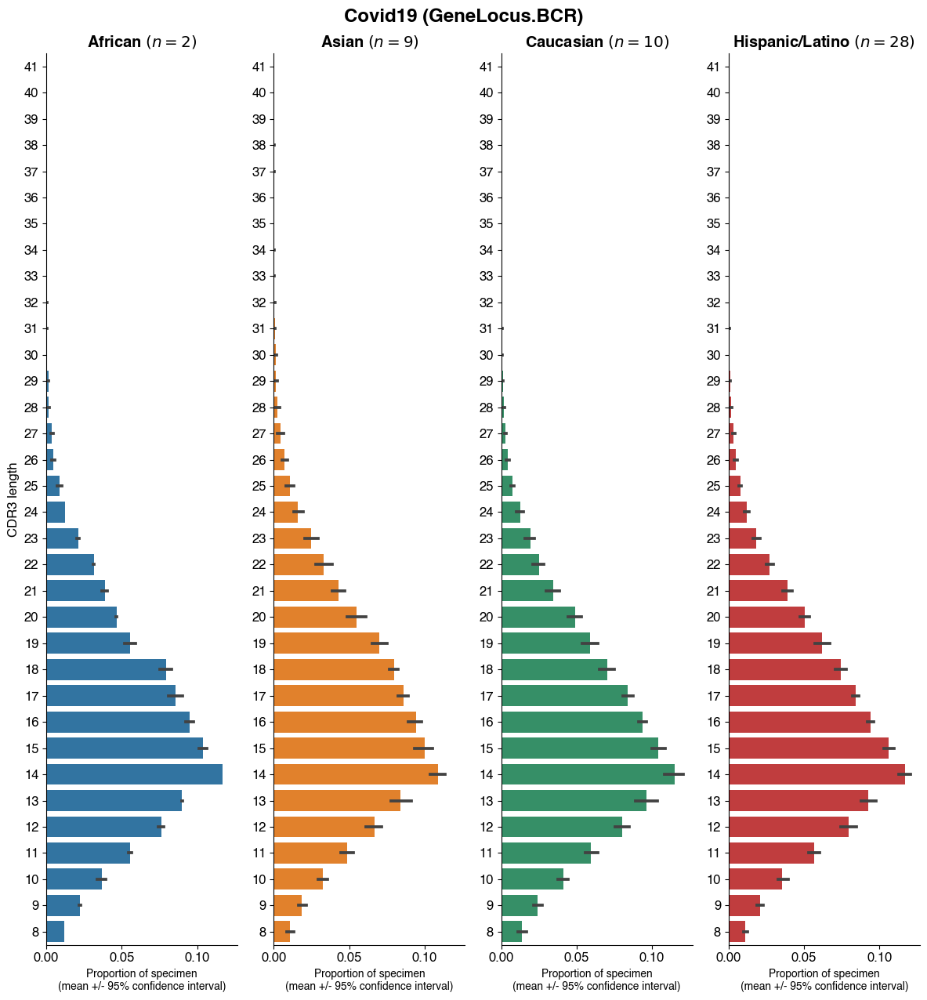

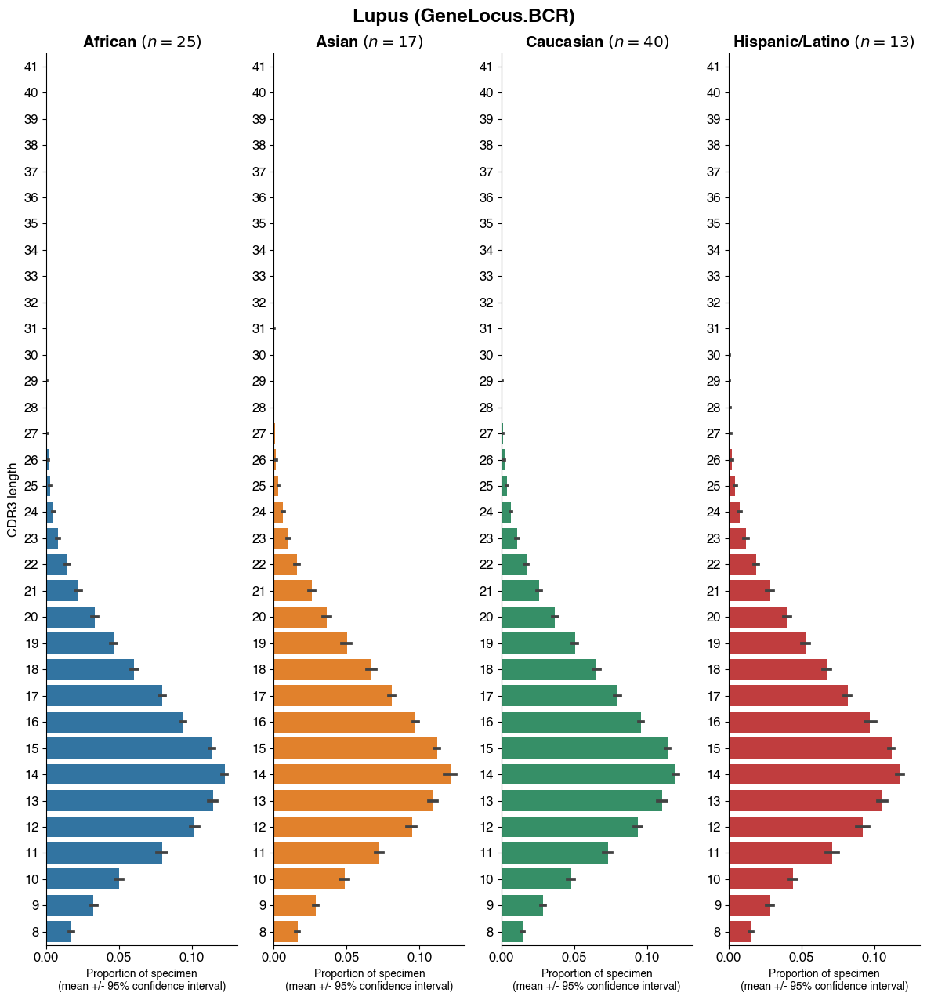

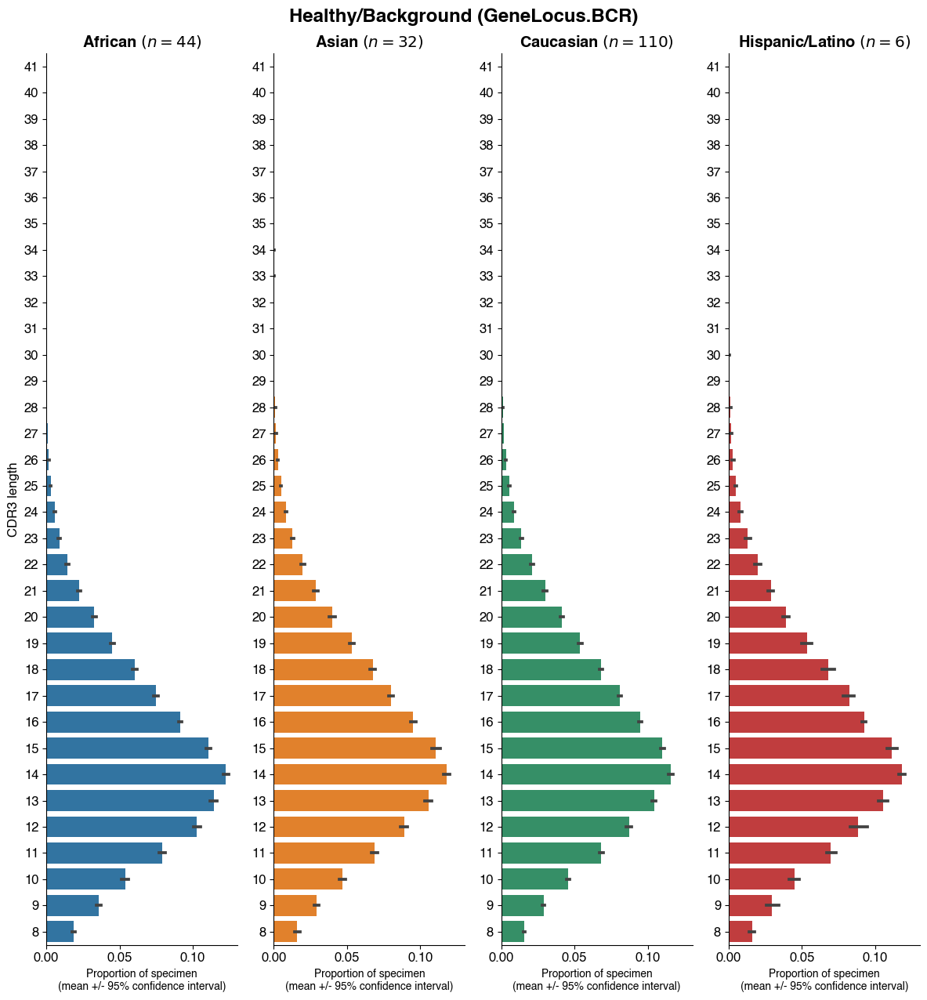

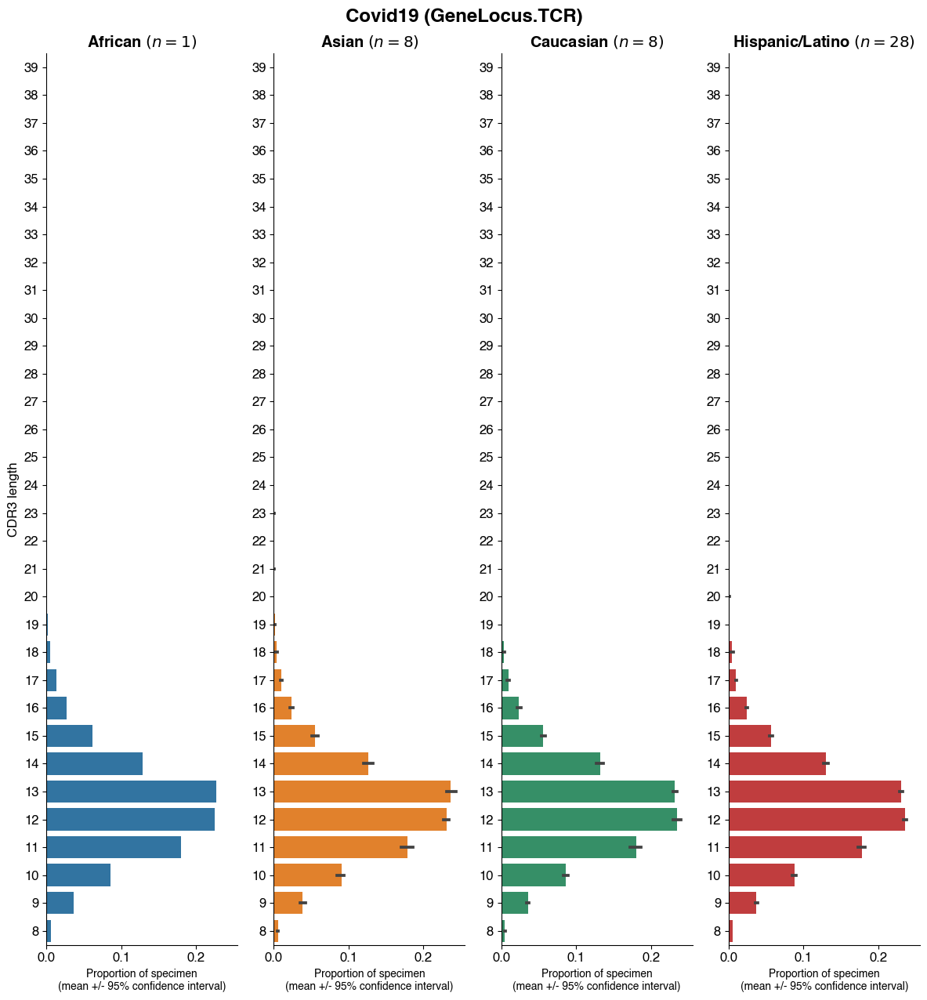

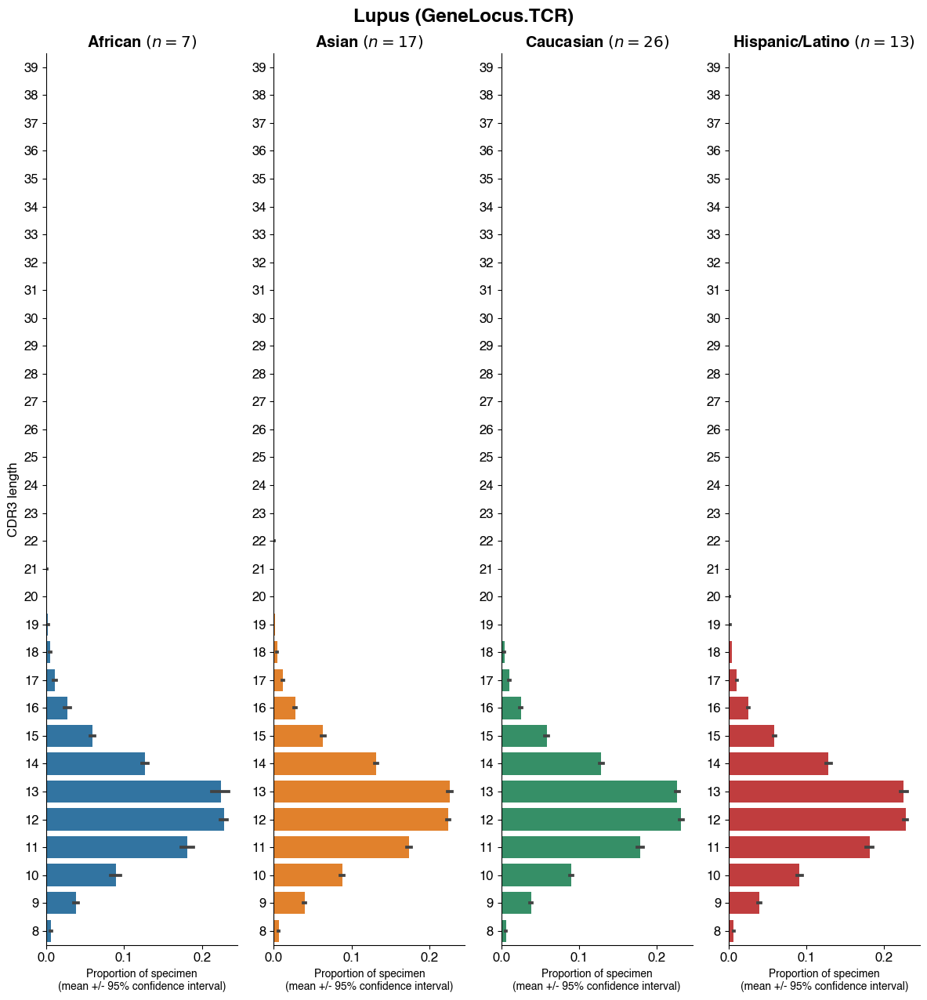

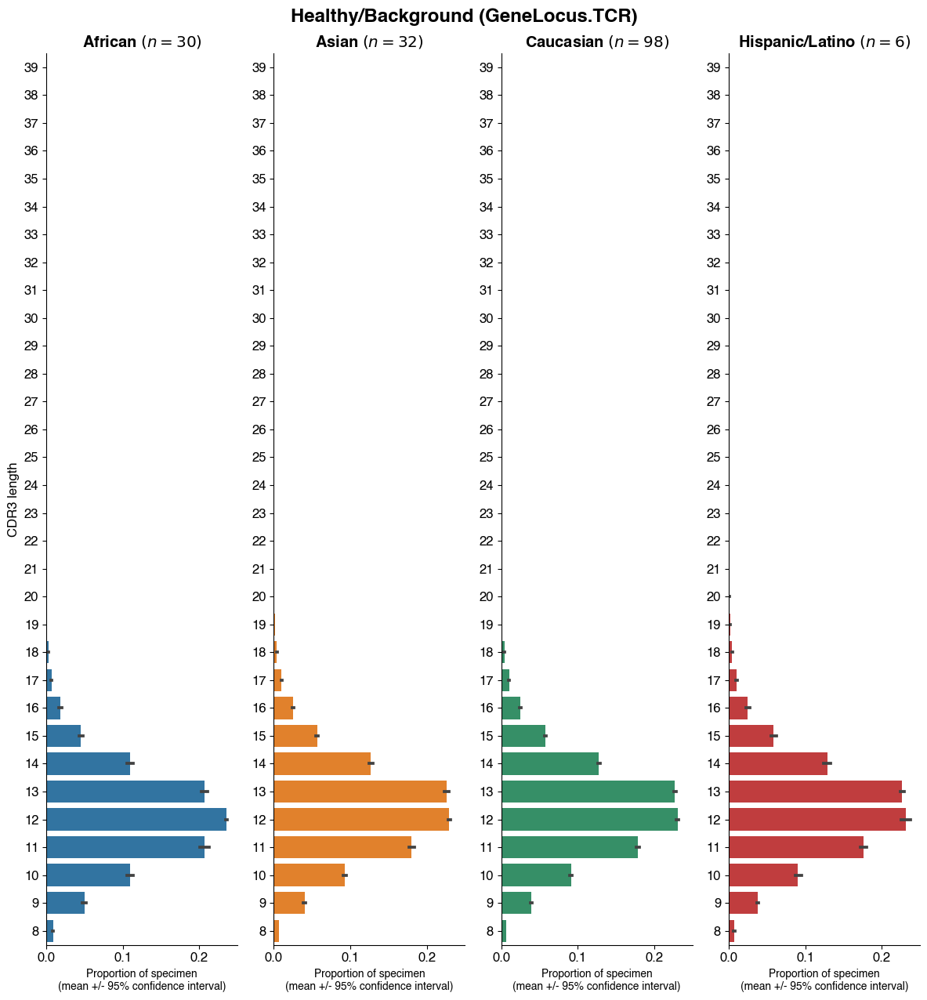

In [21]:
for gene_locus in config.gene_loci_used:
    analyze_cdr3_length_distribution_by_subgroup(
        gene_locus, group_key="ethnicity_condensed"
    )

## Investigate means directly for two V genes of interest

In [22]:
has_BCR = GeneLocus.BCR in v_gene_use_proportions_by_specimen_and_ethnicity

if has_BCR:
    v_gene_usage_proportions_by_specimen_annot_melt = (
        v_gene_use_proportions_by_specimen_and_ethnicity[GeneLocus.BCR]
    )
    display(v_gene_usage_proportions_by_specimen_annot_melt)

,disease,ethnicity_condensed,V gene,Proportion
0,HIV,African,IGHV3-23,0.093012
1,HIV,African,IGHV3-23,0.106734
2,HIV,African,IGHV3-23,0.075632
3,HIV,African,IGHV3-23,0.087797
4,HIV,African,IGHV3-23,0.044962
...,...,...,...,...
34681,Healthy/Background,Caucasian,IGHV3-16,0.000000
34682,Healthy/Background,Caucasian,IGHV3-16,0.000000
34683,Healthy/Background,Hispanic/Latino,IGHV3-16,0.000000
34684,Healthy/Background,Hispanic/Latino,IGHV3-16,0.000000


In [23]:
if has_BCR:
    display(
        v_gene_usage_proportions_by_specimen_annot_melt[
            (
                v_gene_usage_proportions_by_specimen_annot_melt["V gene"].isin(
                    ["IGHV5-a", "IGHV4-b"]
                )
            )
            & (
                v_gene_usage_proportions_by_specimen_annot_melt["disease"].isin(
                    [healthy_label, "Covid19"]
                )
            )
        ]
        .groupby(["disease", "V gene", "ethnicity_condensed"])["Proportion"]
        .mean()
        .apply(
            # print as percentage
            lambda mean: f"{mean:0.2%}"
        )
    )

disease             V gene   ethnicity_condensed
Covid19             IGHV4-b  African                3.40%
                             Asian                  0.22%
                             Caucasian              0.90%
                             Hispanic/Latino        0.80%
                    IGHV5-a  African                0.00%
                             Asian                  0.22%
                             Caucasian              0.64%
                             Hispanic/Latino        0.74%
Healthy/Background  IGHV4-b  African                3.84%
                             Asian                  1.17%
                             Caucasian              0.99%
                             Hispanic/Latino        1.06%
                    IGHV5-a  African                0.33%
                             Asian                  0.73%
                             Caucasian              0.58%
                             Hispanic/Latino        0.54%
Name: Proportion, dtype

In [24]:
# repeat, without disease filter
if has_BCR:
    display(
        v_gene_usage_proportions_by_specimen_annot_melt[
            v_gene_usage_proportions_by_specimen_annot_melt["V gene"].isin(
                ["IGHV5-a", "IGHV4-b"]
            )
        ]
        .groupby(["disease", "V gene", "ethnicity_condensed"])["Proportion"]
        .mean()
        .apply(
            # print as percentage
            lambda mean: f"{mean:0.2%}"
        )
    )

disease             V gene   ethnicity_condensed
Covid19             IGHV4-b  African                3.40%
                             Asian                  0.22%
                             Caucasian              0.90%
                             Hispanic/Latino        0.80%
                    IGHV5-a  African                0.00%
                             Asian                  0.22%
                             Caucasian              0.64%
                             Hispanic/Latino        0.74%
HIV                 IGHV4-b  African                3.71%
                    IGHV5-a  African                0.27%
Healthy/Background  IGHV4-b  African                3.84%
                             Asian                  1.17%
                             Caucasian              0.99%
                             Hispanic/Latino        1.06%
                    IGHV5-a  African                0.33%
                             Asian                  0.73%
                       

In [25]:
# repeat, without disease filter
if has_BCR:
    v_gene_usage_proportions_by_specimen_annot_melt[
        v_gene_usage_proportions_by_specimen_annot_melt["V gene"].isin(
            ["IGHV5-a", "IGHV4-b"]
        )
    ].groupby(["V gene", "ethnicity_condensed"])["Proportion"].mean().apply(
        # print as percentage
        lambda mean: f"{mean:0.2%}"
    )

# Look at V gene usage and CDR3 length distribution by `study_name`

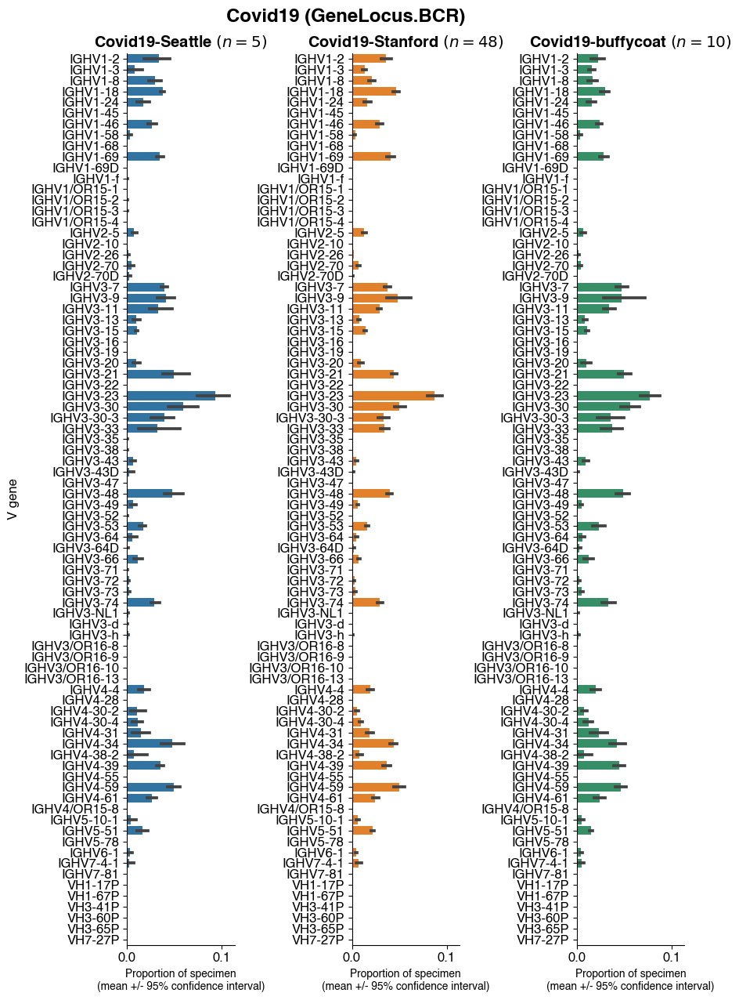

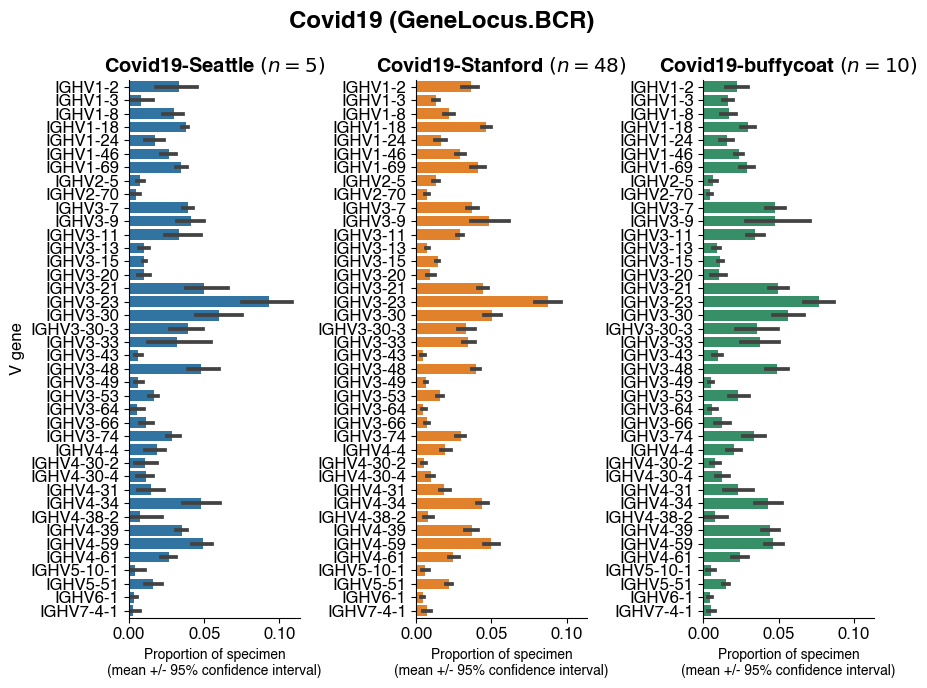

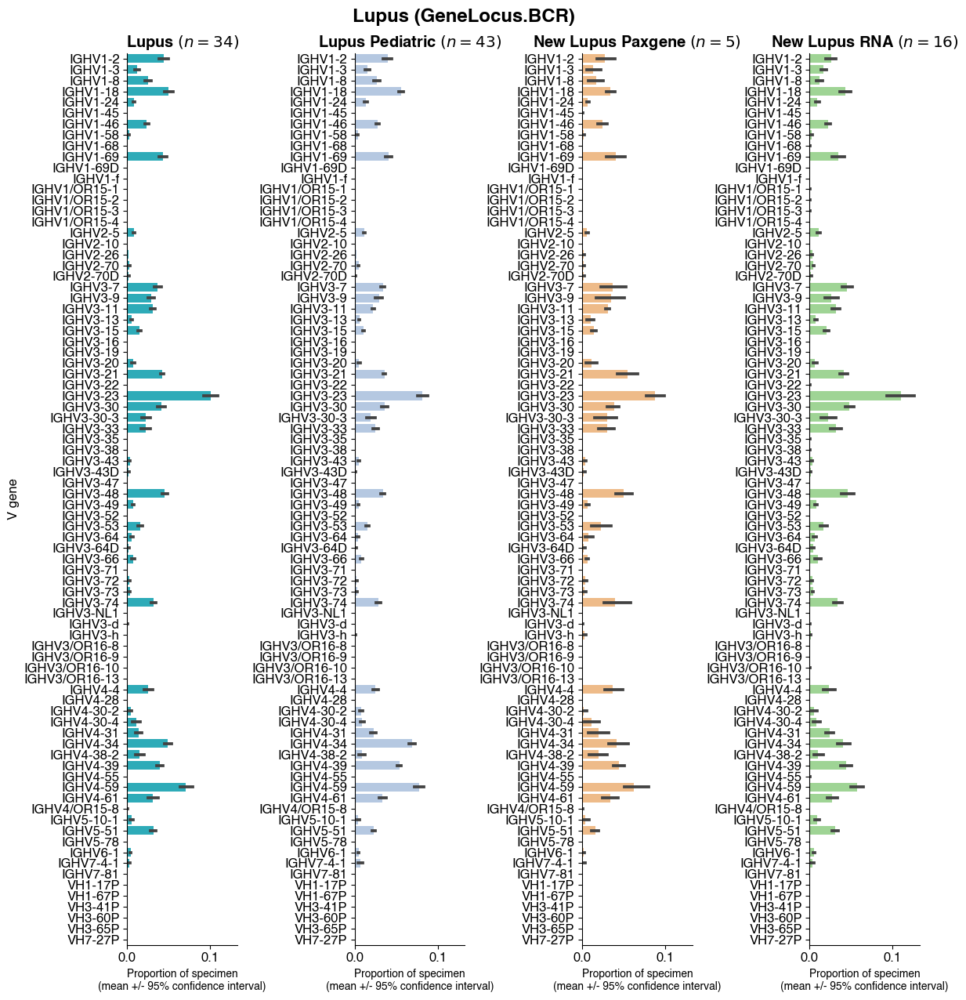

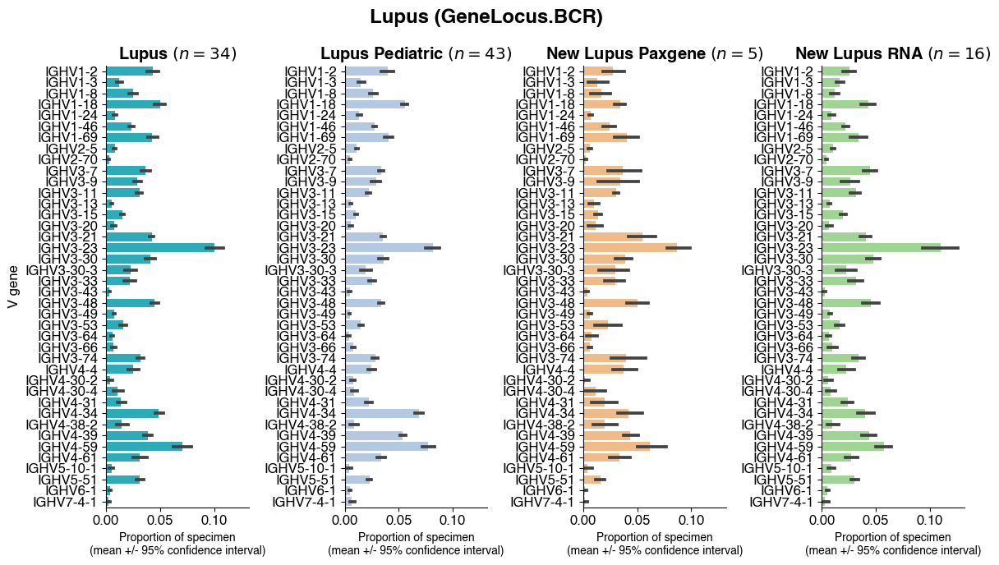

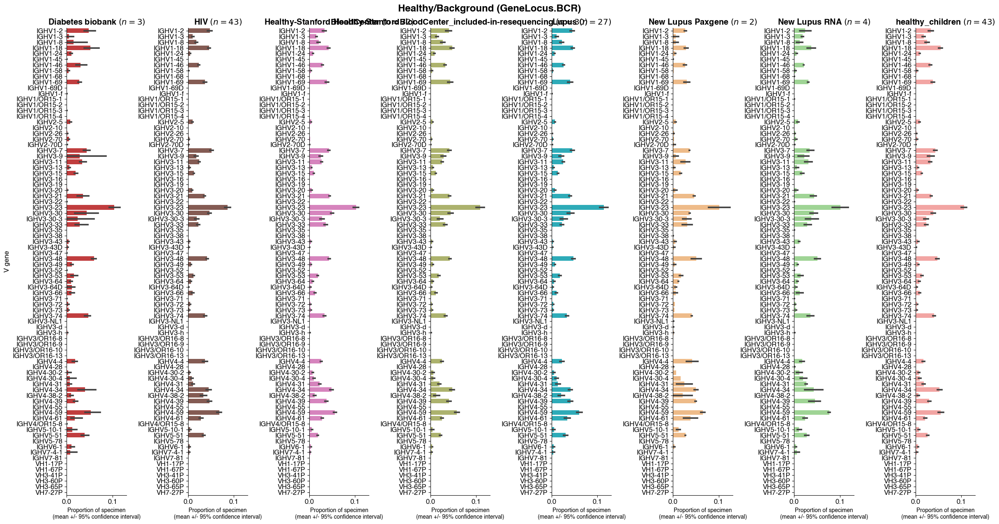

...

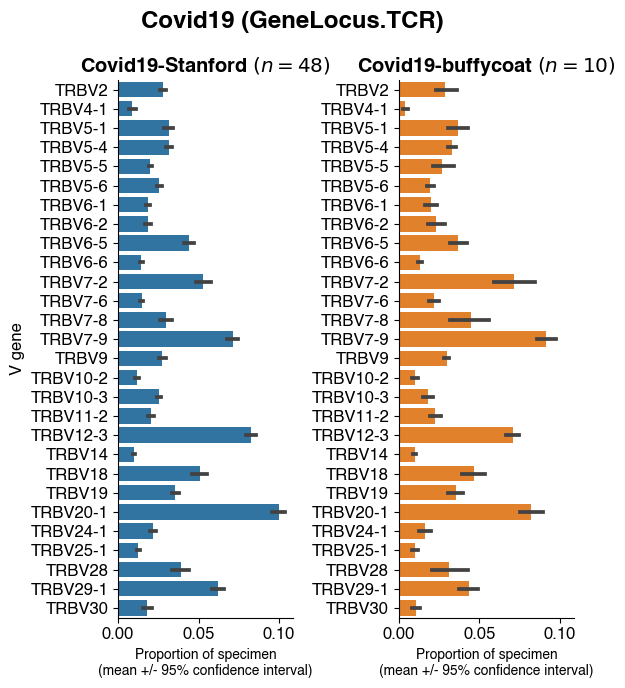

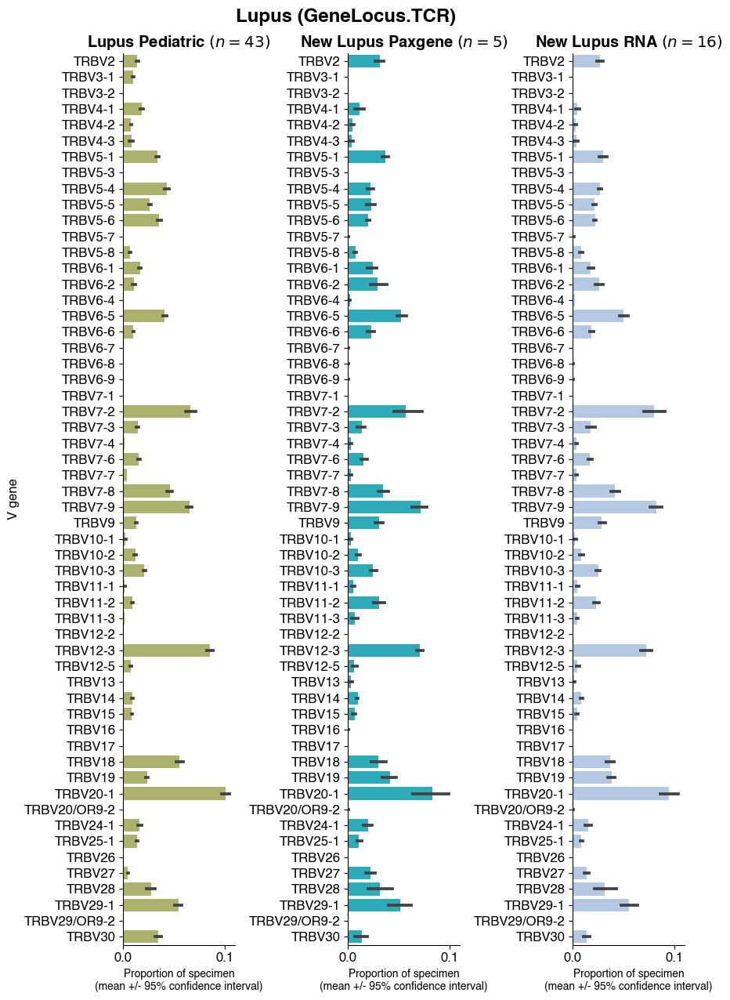

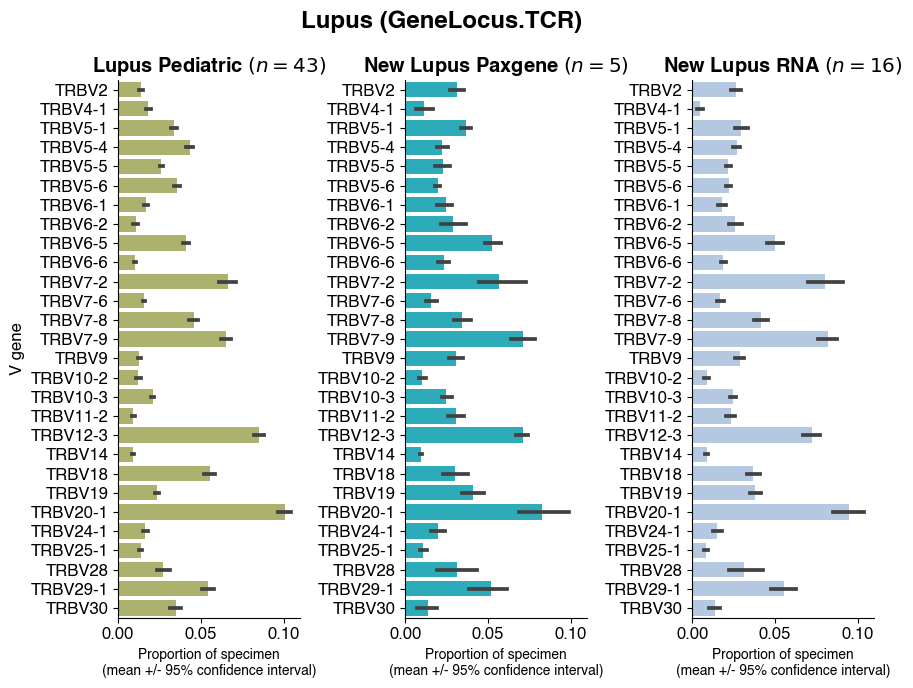

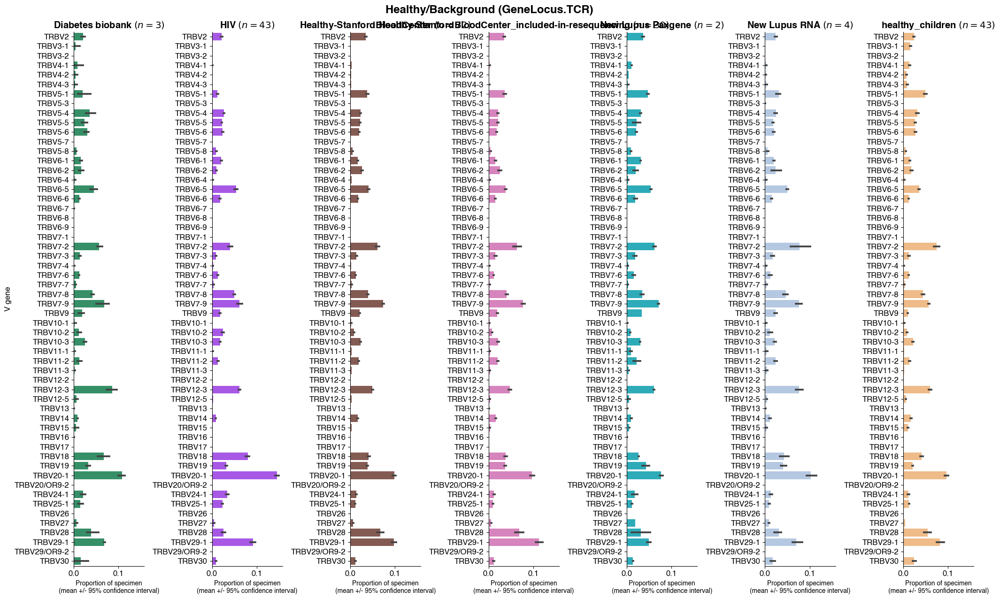

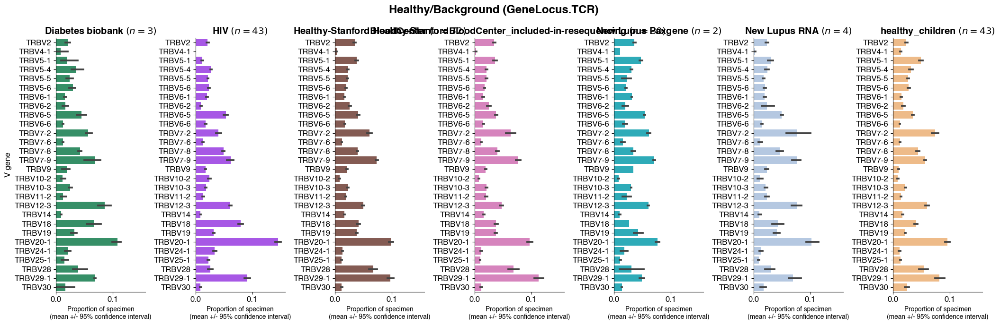

In [26]:
v_gene_use_proportions_by_specimen_and_study_name = {}
for gene_locus in config.gene_loci_used:
    v_gene_use_proportions_by_specimen_and_study_name[
        gene_locus
    ] = analyze_v_gene_proportions_by_subgroup(gene_locus, group_key="study_name")

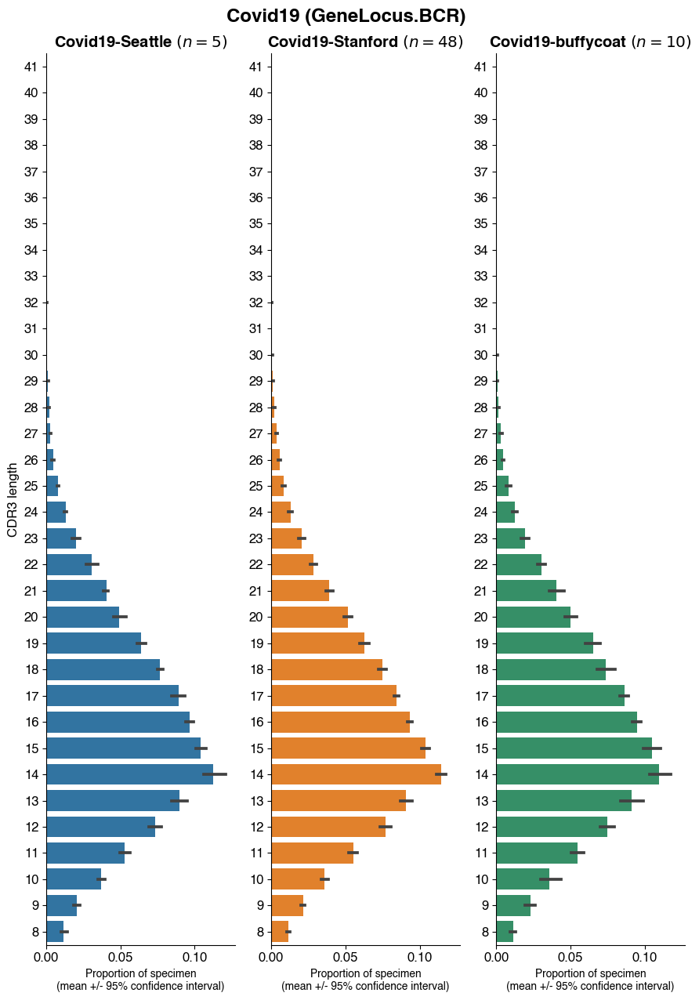

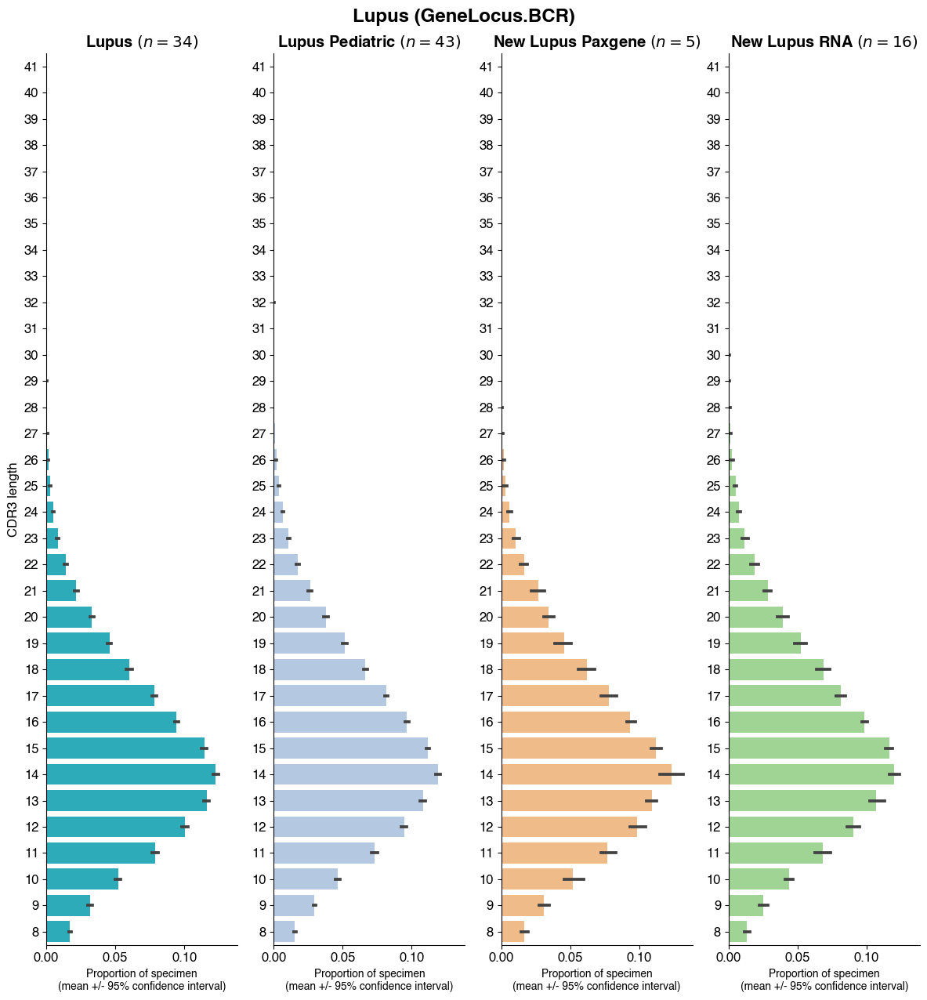

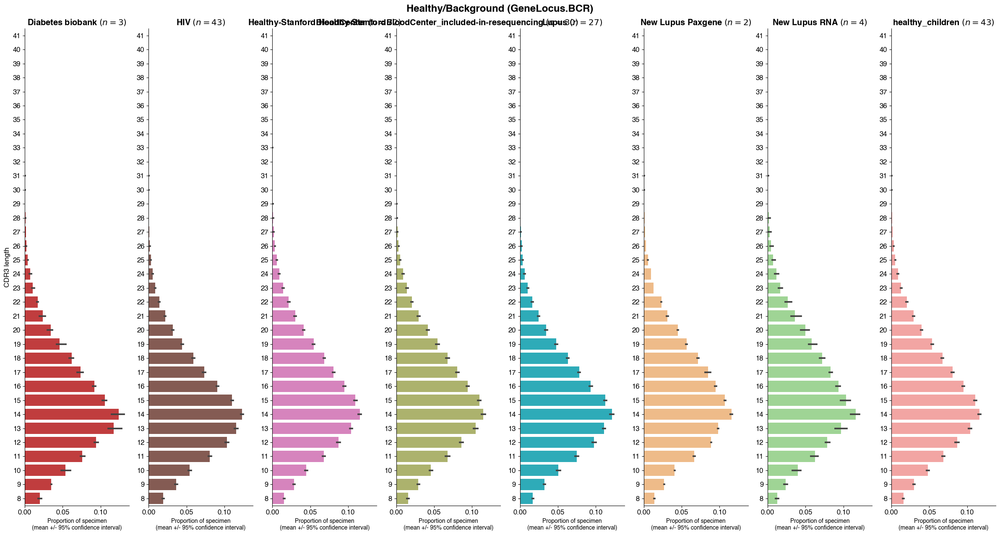

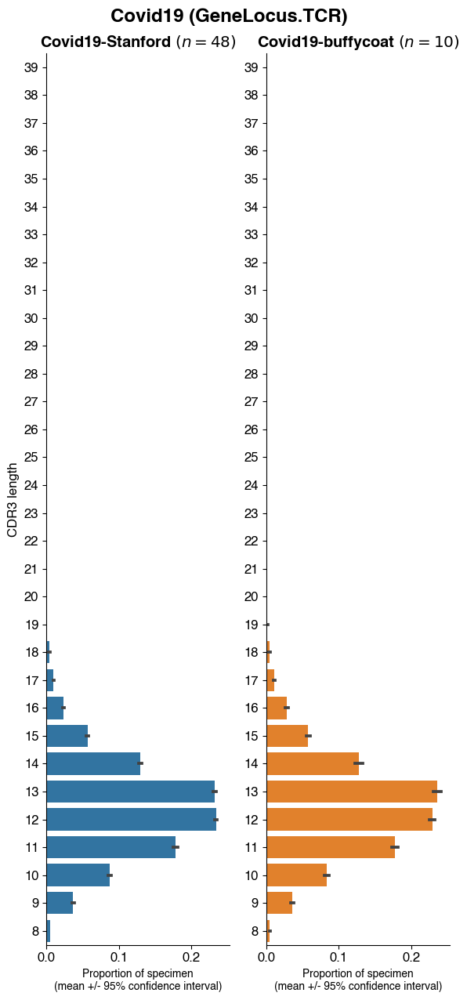

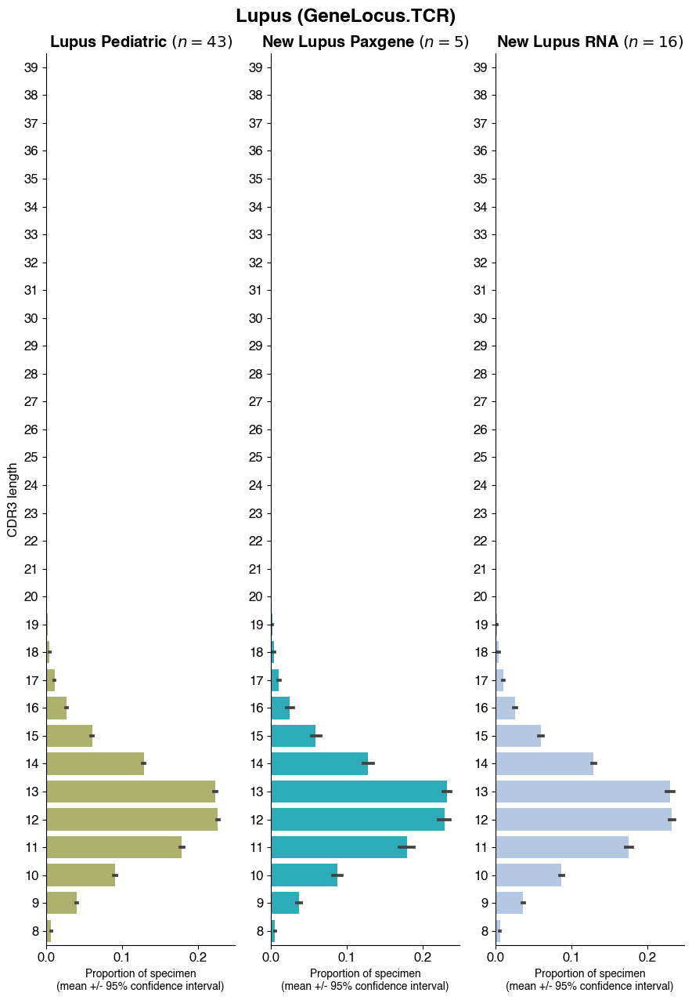

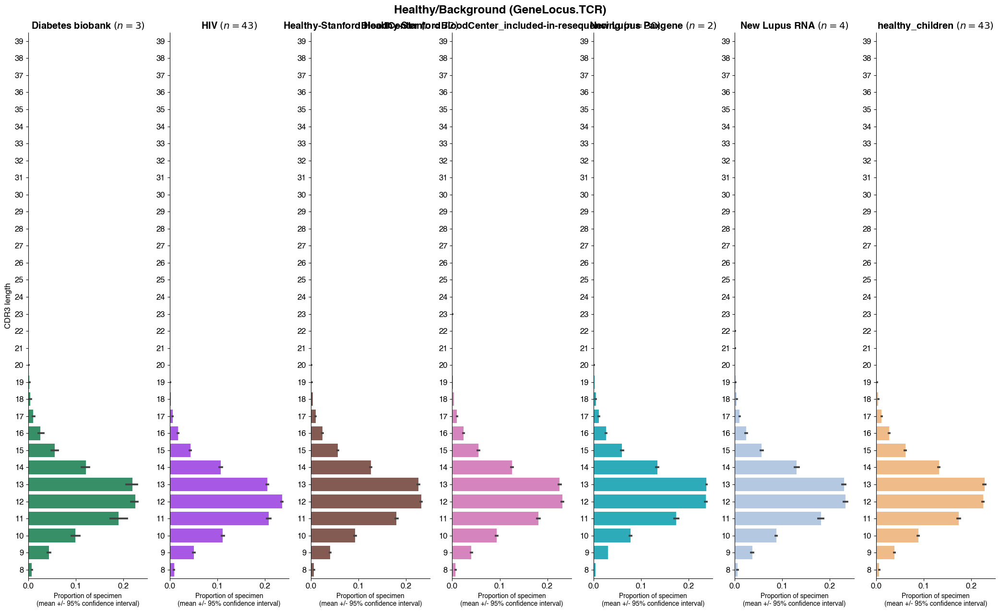

In [27]:
for gene_locus in config.gene_loci_used:
    analyze_cdr3_length_distribution_by_subgroup(gene_locus, group_key="study_name")

In [28]:
# Some TCR V genes are present in some study_names (batches) but not others
if GeneLocus.TCR in v_gene_use_proportions_by_specimen_and_study_name:
    means = (
        v_gene_use_proportions_by_specimen_and_study_name[GeneLocus.TCR]
        .groupby(["disease", "study_name", "V gene"])["Proportion"]
        .mean()
    )
    display(means[means == 0.0])

disease             study_name                                            V gene      
Covid19             Covid19-Stanford                                      TRBV17          0.0
                                                                          TRBV26          0.0
                    Covid19-buffycoat                                     TRBV17          0.0
                                                                          TRBV26          0.0
                                                                          TRBV3-1         0.0
                                                                          TRBV3-2         0.0
HIV                 HIV                                                   TRBV29/OR9-2    0.0
                                                                          TRBV3-2         0.0
Healthy/Background  Diabetes biobank                                      TRBV12-2        0.0
                                                                   

In [29]:
# Some BCR V genes are present in some study_names (batches) but not others
if GeneLocus.BCR in v_gene_use_proportions_by_specimen_and_study_name:
    means = (
        v_gene_use_proportions_by_specimen_and_study_name[GeneLocus.BCR]
        .groupby(["disease", "study_name", "V gene"])["Proportion"]
        .mean()
    )
    display(means[means == 0.0])

disease  study_name        V gene      
Covid19  Covid19-Seattle   IGHV1-68        0.0
                           IGHV1-69D       0.0
                           IGHV1/OR15-4    0.0
                           IGHV2-10        0.0
                           IGHV3-16        0.0
                                          ... 
T1D      Diabetes biobank  IGHV3/OR16-9    0.0
                           VH1-17P         0.0
                           VH3-41P         0.0
                           VH3-60P         0.0
                           VH7-27P         0.0
Name: Proportion, Length: 205, dtype: float64

In [30]:
all_expected_v_genes = helpers.all_observed_v_genes()
[(gl, lst.shape) for gl, lst in all_expected_v_genes.items()]

[(<GeneLocus.BCR: 1>, (83,)), (<GeneLocus.TCR: 2>, (63,))]

In [31]:
if GeneLocus.BCR in v_gene_use_proportions_by_specimen_and_study_name:
    print(
        v_gene_use_proportions_by_specimen_and_study_name[GeneLocus.BCR]["V gene"]
        .unique()
        .shape
    )

(82,)


In [32]:
if GeneLocus.TCR in v_gene_use_proportions_by_specimen_and_study_name:
    print(
        v_gene_use_proportions_by_specimen_and_study_name[GeneLocus.TCR]["V gene"]
        .unique()
        .shape
    )

(56,)


In [33]:
# Any BCR V genes in our entire parquet dataset after ETL step, but not in the plots above (i.e. not in peak timepoint test set?):
if GeneLocus.BCR in v_gene_use_proportions_by_specimen_and_study_name:
    print(
        set.symmetric_difference(
            set(
                v_gene_use_proportions_by_specimen_and_study_name[GeneLocus.BCR][
                    "V gene"
                ]
            ),
            all_expected_v_genes[GeneLocus.BCR],
        )
    )

{'IGHV3-25'}


In [34]:
# Any TCR V genes in our entire parquet dataset after ETL step, but not in the plots above (i.e. not in peak timepoint test set?):
if GeneLocus.TCR in v_gene_use_proportions_by_specimen_and_study_name:
    print(
        set.symmetric_difference(
            set(
                v_gene_use_proportions_by_specimen_and_study_name[GeneLocus.TCR][
                    "V gene"
                ]
            ),
            all_expected_v_genes[GeneLocus.TCR],
        )
    )

{'TRBV21/OR9-2', 'TRBV1', 'TRBV26/OR9-2', 'TRBV23-1', 'TRBV12-1', 'TRBV21-1', 'TRBV12-4'}


# Look at V gene usage and CDR3 lengths by Covid19 severity

No disease_severity group info for Healthy/Background - skipping
No disease_severity group info for Healthy/Background - skipping


No disease_severity group info for Healthy/Background - skipping
No disease_severity group info for Healthy/Background - skipping


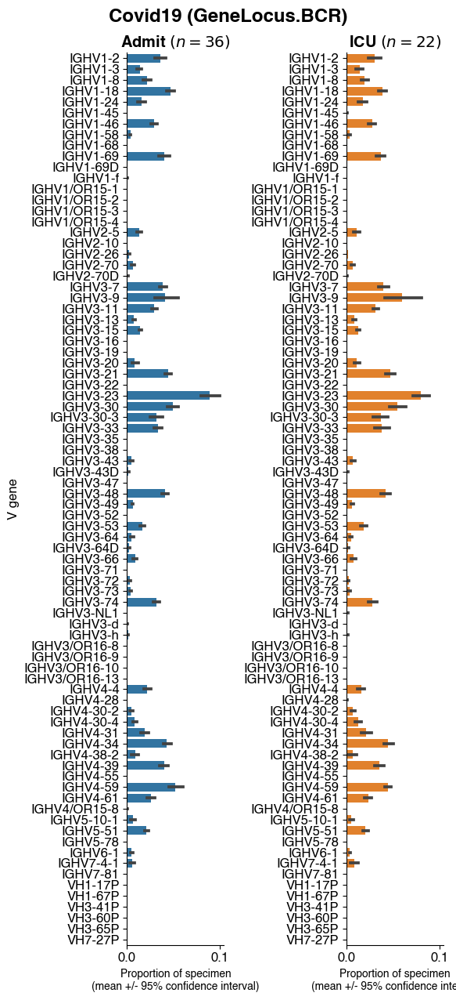

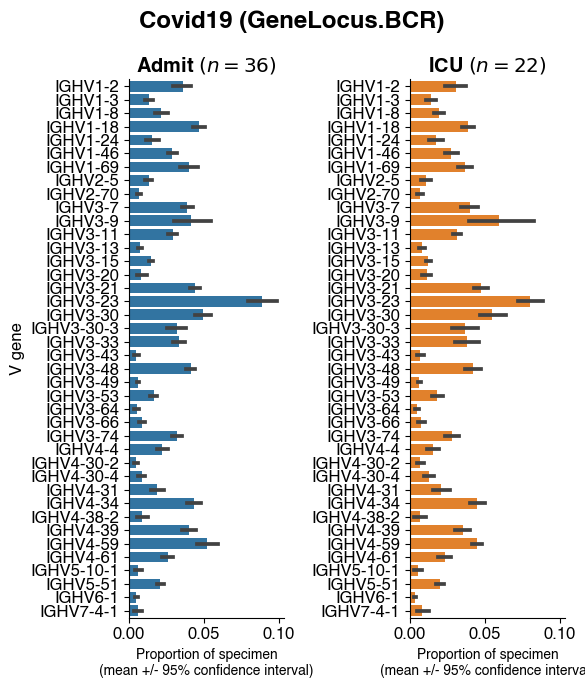

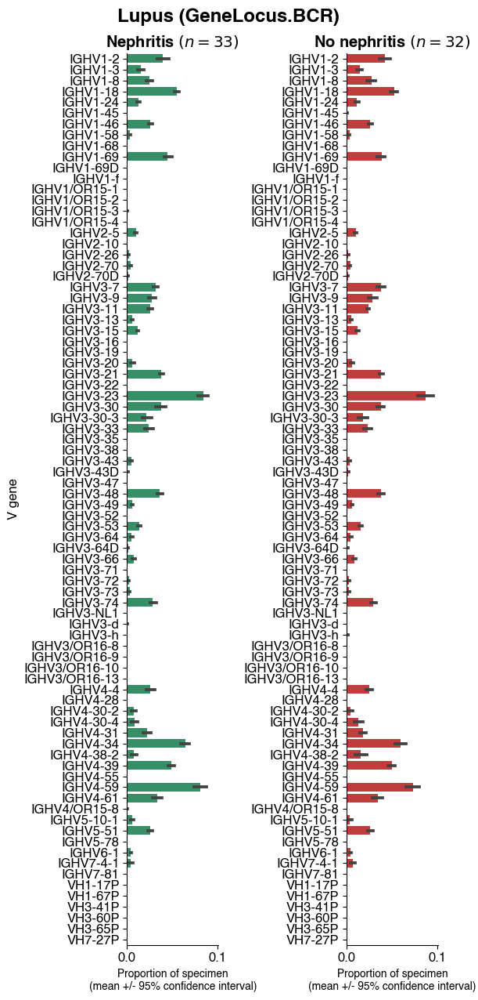

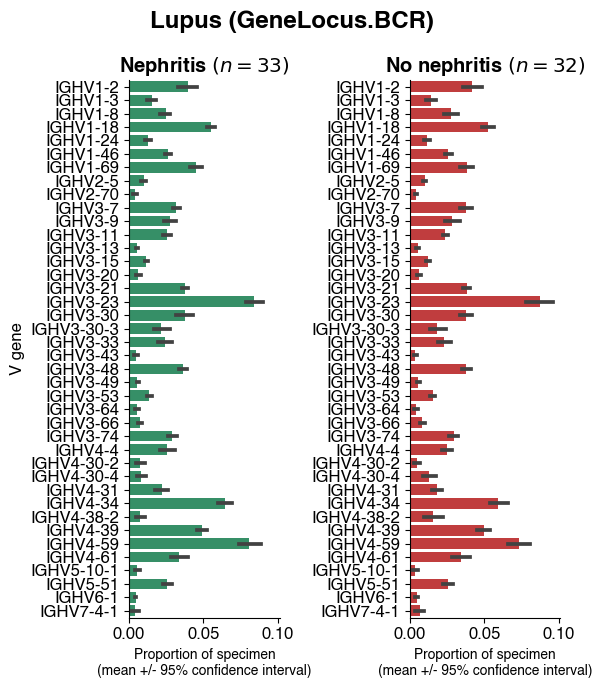

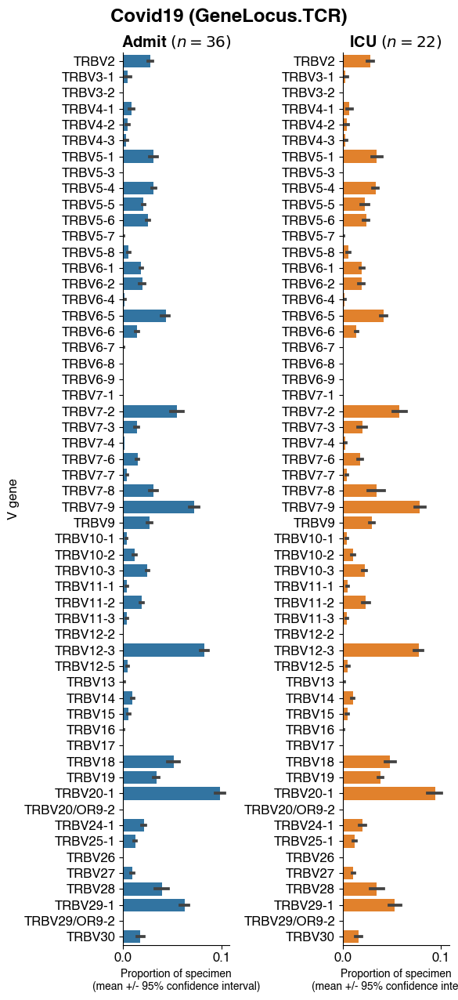

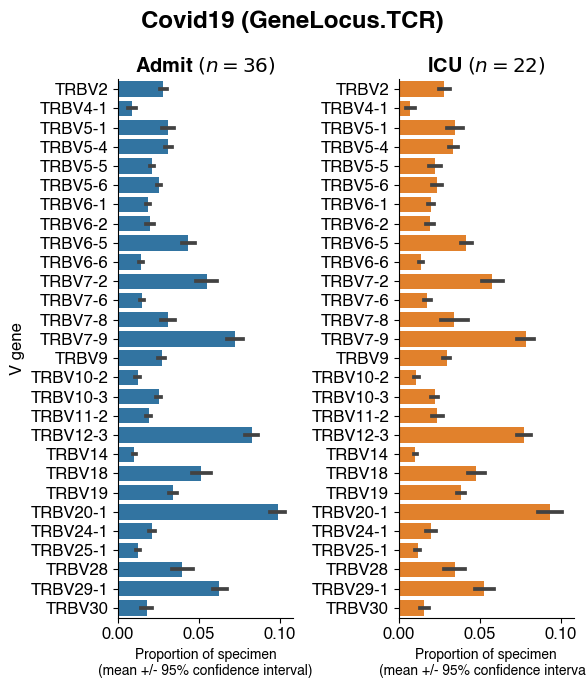

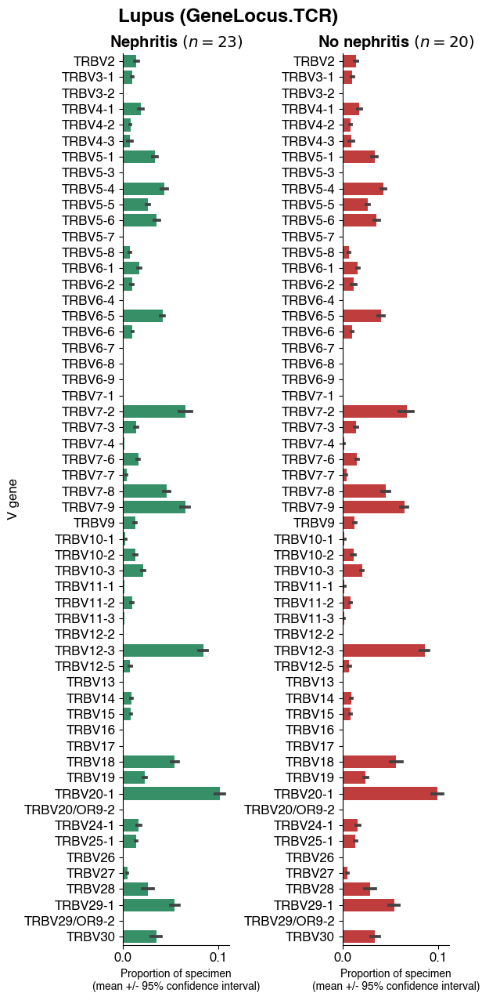

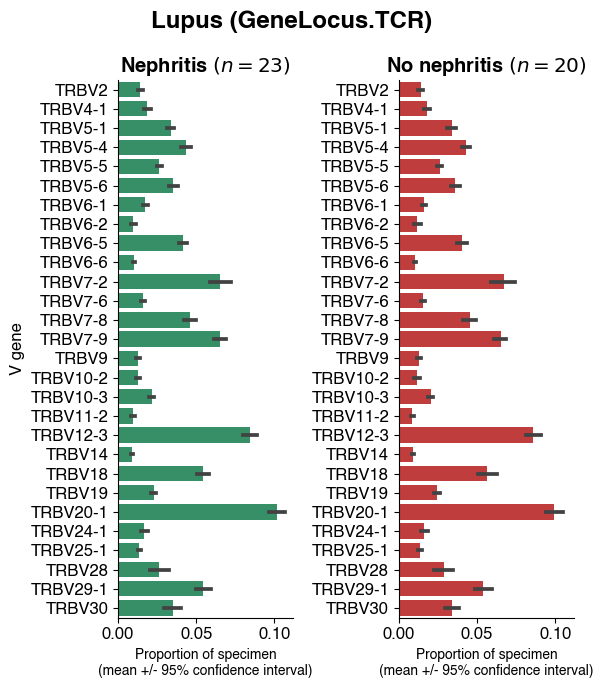

In [35]:
for gene_locus in config.gene_loci_used:
    analyze_v_gene_proportions_by_subgroup(gene_locus, group_key="disease_severity")

No disease_severity group info for Healthy/Background - skipping


No disease_severity group info for Healthy/Background - skipping


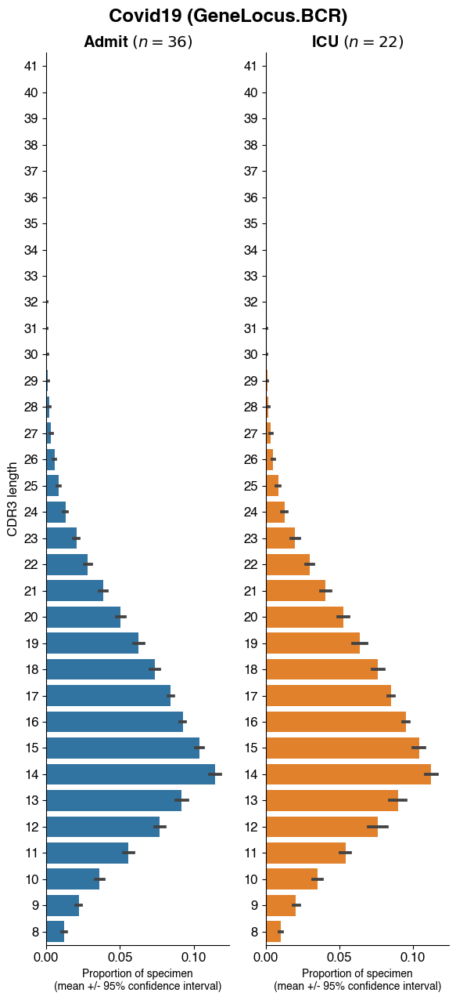

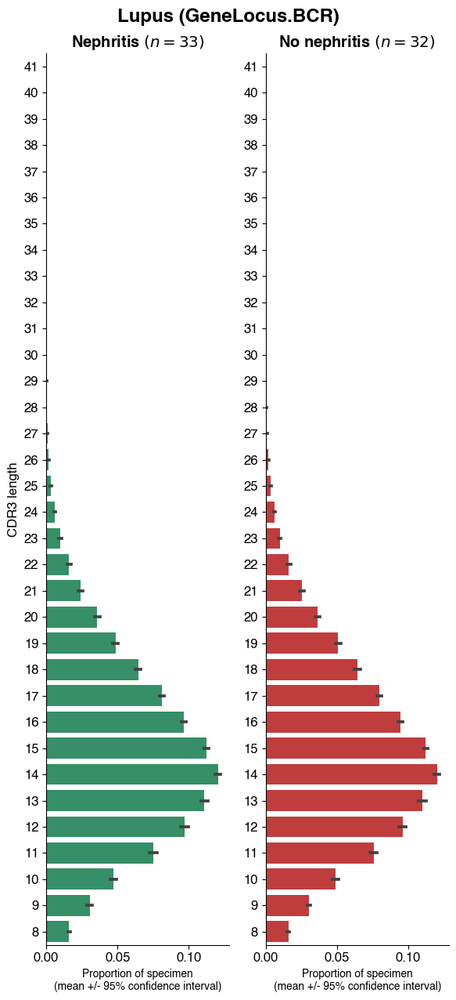

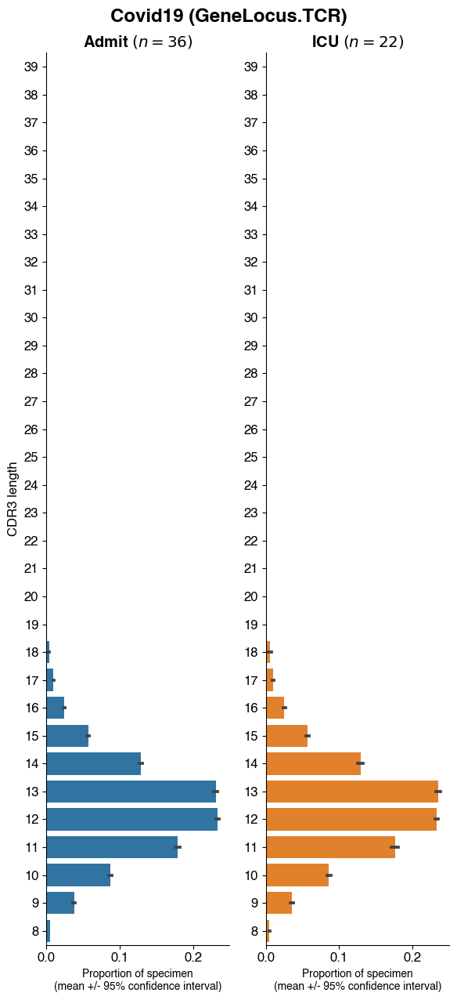

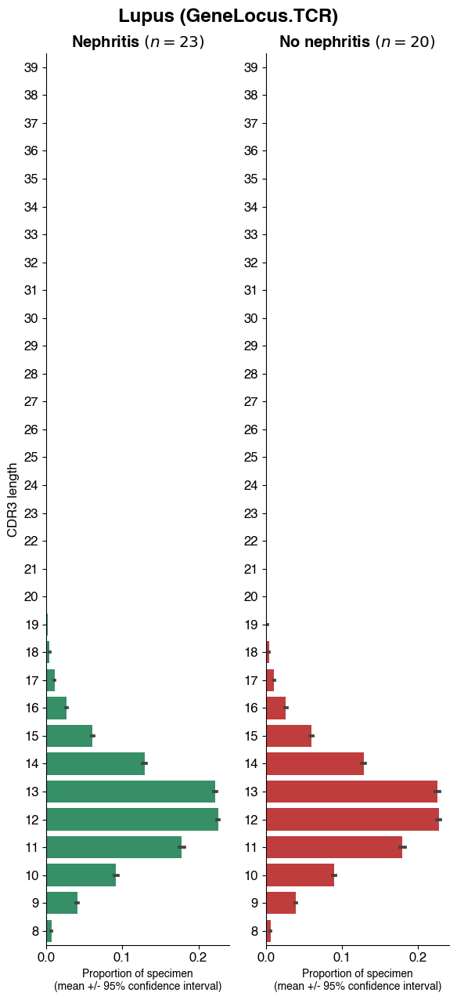

In [36]:
for gene_locus in config.gene_loci_used:
    analyze_cdr3_length_distribution_by_subgroup(
        gene_locus, group_key="disease_severity"
    )

# Plot V gene usage of each specimen on PCA/UMAP, and compare intra-disease batch distances vs inter-disease distances

Using cosine distance between V gene use proportion vectors per specimen (or mean across specimens in a disease-batch)

In [37]:
# consider euclidean distance too?
def v_gene_use_plot_by_batch(
    gene_locus: GeneLocus, distance_metric="cosine", filter_v_genes=True
):
    output_dir, highres_output_dir = get_dirs(gene_locus)

    # Reload
    (
        specimen_v_gene_counts_df_test_only,
        v_gene_cols,
        v_gene_cols_filtered,
    ) = import_v_gene_counts(gene_locus=gene_locus)

    if filter_v_genes:
        # Use filtered set of V genes - ignore rare ones that may make specimens look artificially distinct
        v_gene_cols = v_gene_cols_filtered

    # Get V gene usage proportions per specimen
    v_gene_usage_proportions_by_specimen = pd.concat(
        [
            genetools.stats.normalize_rows(
                specimen_v_gene_counts_df_test_only[v_gene_cols]
            ),
            specimen_v_gene_counts_df_test_only["disease"],
        ],
        axis=1,
    )

    v_gene_usage_proportions_by_specimen_annot = genetools.helpers.merge_into_left(
        v_gene_usage_proportions_by_specimen[v_gene_cols],
        extra_specimen_metadata.set_index("specimen_label"),
    )
    assert (
        v_gene_usage_proportions_by_specimen_annot.shape[0]
        == v_gene_usage_proportions_by_specimen.shape[0]
    )
    assert not v_gene_usage_proportions_by_specimen_annot["disease"].isna().any()
    assert not v_gene_usage_proportions_by_specimen_annot["study_name"].isna().any()

    ## PCA and UMAP of V gene use by specimen, colored by disease + batch
    adata_vgene_use = anndata.AnnData(
        X=v_gene_usage_proportions_by_specimen_annot[v_gene_cols],
        obs=v_gene_usage_proportions_by_specimen_annot[
            v_gene_usage_proportions_by_specimen_annot.columns[
                ~v_gene_usage_proportions_by_specimen_annot.columns.isin(v_gene_cols)
            ]
        ],
    )

    adata_vgene_use.obs["disease_and_batch"] = (
        adata_vgene_use.obs["disease"] + " - " + adata_vgene_use.obs["study_name"]
    )

    adata_vgene_use.raw = adata_vgene_use
    sc.pp.scale(adata_vgene_use)
    sc.pp.pca(adata_vgene_use)
    sc.pp.neighbors(adata_vgene_use, metric=distance_metric)
    sc.tl.umap(adata_vgene_use)

    fig_pca = sc.pl.pca(
        adata_vgene_use,
        color="disease_and_batch",
        alpha=0.5,
        return_fig=True,
        title=f"V gene proportions PCA by disease+batch\n{gene_locus}",
    )
    genetools.plots.savefig(
        fig_pca,
        highres_output_dir
        / f"v_gene_proportions_by_specimen.pca.color_by_disease_batch.png",
        dpi=300,
    )
    fig_umap = sc.pl.umap(
        adata_vgene_use,
        color="disease_and_batch",
        alpha=0.5,
        return_fig=True,
        title=f"V gene proportions UMAP by disease+batch\n{gene_locus}",
    )
    genetools.plots.savefig(
        fig_umap,
        highres_output_dir
        / f"v_gene_proportions_by_specimen.umap.color_by_disease_batch.png",
        dpi=300,
    )

    ## Heatmap of pairwise distance between means of each disease+batch category
    means = v_gene_usage_proportions_by_specimen_annot.groupby(
        ["disease", "study_name"]
    )[v_gene_cols].mean()
    # distance matrix
    dist_mat = pd.DataFrame(
        squareform(pdist(means, metric=distance_metric)),
        # combine disease and study name multiindex
        index=means.index.map(" - ".join),
        columns=means.index.map(" - ".join),
    )
    #     ax = sns.heatmap(dist_mat, cmap="Blues", square=True)
    #     ax.set_xticklabels(
    #         ax.get_xticklabels(), rotation=60, size=12, horizontalalignment="right"
    #     )

    fig_means, ax_means = plot_triangular_heatmap(
        dist_mat,
        vmin=0,
        colorbar_label="Distance",
        figsize=(20, 20),
    )
    genetools.plots.wrap_tick_labels(
        ax_means, wrap_x_axis=True, wrap_y_axis=False, wrap_amount=10
    )
    ax_means.set_title(
        f"{distance_metric} distance between disease+batch mean V gene usage\n{gene_locus}"
    )
    genetools.plots.savefig(
        fig_means,
        highres_output_dir
        / f"v_gene_proportions_by_specimen.means_by_disease_batch.distance_heatmap.png",
        dpi=300,
    )

    ## Repeat with median to be resilient to outliers:
    # Heatmap of pairwise distance between medians of each disease+batch category
    medians = v_gene_usage_proportions_by_specimen_annot.groupby(
        ["disease", "study_name"]
    )[v_gene_cols].median()
    # distance matrix
    dist_mat = pd.DataFrame(
        squareform(pdist(medians, metric=distance_metric)),
        # combine disease and study name multiindex
        index=medians.index.map(" - ".join),
        columns=medians.index.map(" - ".join),
    )
    fig_medians, ax_medians = plot_triangular_heatmap(
        dist_mat,
        vmin=0,
        colorbar_label="Distance",
        figsize=(20, 20),
    )
    genetools.plots.wrap_tick_labels(
        ax_medians, wrap_x_axis=True, wrap_y_axis=False, wrap_amount=10
    )
    ax_medians.set_title(
        f"{distance_metric} distance between disease+batch median V gene usage\n{gene_locus}"
    )
    genetools.plots.savefig(
        fig_medians,
        highres_output_dir
        / f"v_gene_proportions_by_specimen.medians_by_disease_batch.distance_heatmap.png",
        dpi=300,
    )

    ## Get pairwise distances between specimens. Plot as boxplots grouped by specimen info.

    # Sort order so that when we construct pairwise distance dataframe and take upper triangle, we are left with all comparisons as A vs B only, not some as A vs B and others as B vs A.
    v_gene_usage_proportions_by_specimen_annot.sort_values(
        ["disease", "study_name"], inplace=True
    )

    new_index = pd.MultiIndex.from_frame(
        v_gene_usage_proportions_by_specimen_annot.reset_index()[
            ["specimen_label", "disease", "study_name"]
        ]
    )
    all_dists = pd.DataFrame(
        squareform(
            pdist(
                v_gene_usage_proportions_by_specimen_annot[v_gene_cols],
                metric=distance_metric,
            )
        ),
        index=new_index.rename([f"{name}_1" for name in new_index.names]),
        columns=new_index.rename([f"{name}_2" for name in new_index.names]),
    )

    # Make sure no nans to begin with, because we're going to set lower triangle to nan and drop all nans.
    assert not all_dists.isna().any().any()

    # Upper triangle mask to remove symmetric duplicate entries
    upper_triangle_mask = np.triu(np.ones_like(all_dists, dtype=bool))
    all_dists = all_dists.where(upper_triangle_mask)

    # Move to long form
    # Special stack logic to handle multiindex
    # Also drop N/As
    all_dists = all_dists.stack(
        level=list(range(all_dists.columns.nlevels)), dropna=True
    ).reset_index(name="distance")

    all_dists["comparison"] = (
        all_dists["disease_1"]
        + " - "
        + all_dists["study_name_1"]
        + " vs "
        + all_dists["disease_2"]
        + " - "
        + all_dists["study_name_2"]
    )

    fig_boxplot, ax = plt.subplots(figsize=(8, all_dists["comparison"].nunique() // 2))
    sns.boxplot(
        data=all_dists,
        x="distance",
        y="comparison",
        order=all_dists.groupby("comparison")["distance"].median().sort_values().index,
        ax=ax,
    )
    ax.set_xlabel(f"{distance_metric} distance")
    ax.set_title(
        f"Pairwise distances between specimens V gene use proportions\n{gene_locus}"
    )
    genetools.plots.savefig(
        fig_boxplot,
        highres_output_dir
        / f"v_gene_proportions_by_specimen.pairwise_distances.boxplot_by_disease_batch.png",
        dpi=300,
    )

    return adata_vgene_use

{"message": "/tmp/ipykernel_3367766/64972007.py:41: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.\n  adata_vgene_use = anndata.AnnData(\n", "time": "2024-02-07T09:14:16.726513"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: \u001bThe 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.\u001b\n  @numba.jit()\n", "time": "2024-02-07T09:14:16.838405"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: \u001bThe 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.\u001b\n  @numba.jit()\n", "time": "2024-02-07T09:14:16.841969"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: \u001bThe 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.\u001b\n  @numba.jit()\n", "time": "2024-02-07T09:14:16.845346"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: \u001bThe 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.\u001b\n  @numba.jit()\n", "time": "2024-02-07T09:14:23.262614"}


2024-02-07 09:14:27.490515: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-02-07 09:14:35.484566: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


{"message": "... storing 'participant_label' as categorical", "time": "2024-02-07T09:14:58.074408"}


{"message": "... storing 'disease' as categorical", "time": "2024-02-07T09:14:58.079960"}


{"message": "... storing 'specimen_time_point' as categorical", "time": "2024-02-07T09:14:58.083640"}


{"message": "... storing 'participant_description' as categorical", "time": "2024-02-07T09:14:58.090505"}


{"message": "... storing 'study_name' as categorical", "time": "2024-02-07T09:14:58.094843"}


{"message": "... storing 'disease_subtype' as categorical", "time": "2024-02-07T09:14:58.099330"}


{"message": "... storing 'sex' as categorical", "time": "2024-02-07T09:14:58.103451"}


{"message": "... storing 'ethnicity_condensed' as categorical", "time": "2024-02-07T09:14:58.107947"}


{"message": "... storing 'age_group' as categorical", "time": "2024-02-07T09:14:58.111980"}


{"message": "... storing 'age_group_binary' as categorical", "time": "2024-02-07T09:14:58.115350"}


{"message": "... storing 'age_group_pediatric' as categorical", "time": "2024-02-07T09:14:58.119114"}


{"message": "... storing 'disease_severity' as categorical", "time": "2024-02-07T09:14:58.122481"}


{"message": "... storing 'symptoms_Lupus_ANA' as categorical", "time": "2024-02-07T09:14:58.127302"}


{"message": "... storing 'symptoms_Lupus_Arthritis' as categorical", "time": "2024-02-07T09:14:58.130265"}


{"message": "... storing 'symptoms_Lupus_Discoid_Rash' as categorical", "time": "2024-02-07T09:14:58.134205"}


{"message": "... storing 'symptoms_Lupus_Hematologic_Disorder' as categorical", "time": "2024-02-07T09:14:58.137141"}


{"message": "... storing 'symptoms_Lupus_Immunologic_Disorder' as categorical", "time": "2024-02-07T09:14:58.140245"}


{"message": "... storing 'symptoms_Lupus_La +/-' as categorical", "time": "2024-02-07T09:14:58.143782"}


{"message": "... storing 'symptoms_Lupus_Malar_Rash' as categorical", "time": "2024-02-07T09:14:58.146864"}


{"message": "... storing 'symptoms_Lupus_Neurologic_Disorder' as categorical", "time": "2024-02-07T09:14:58.150595"}


{"message": "... storing 'symptoms_Lupus_Oral_Ulcers' as categorical", "time": "2024-02-07T09:14:58.153679"}


{"message": "... storing 'symptoms_Lupus_Photosensitivity' as categorical", "time": "2024-02-07T09:14:58.157376"}


{"message": "... storing 'symptoms_Lupus_Renal Disorder' as categorical", "time": "2024-02-07T09:14:58.160816"}


{"message": "... storing 'symptoms_Lupus_Ribo_P +/-' as categorical", "time": "2024-02-07T09:14:58.163802"}


{"message": "... storing 'symptoms_Lupus_Ro +/-' as categorical", "time": "2024-02-07T09:14:58.167347"}


{"message": "... storing 'symptoms_Lupus_Serositis' as categorical", "time": "2024-02-07T09:14:58.170463"}


{"message": "... storing 'symptoms_Lupus_aPL +/-' as categorical", "time": "2024-02-07T09:14:58.174022"}


{"message": "... storing 'symptoms_Lupus_dsDNA +/-' as categorical", "time": "2024-02-07T09:14:58.177687"}


{"message": "... storing 'symptoms_Lupus_sm +/-' as categorical", "time": "2024-02-07T09:14:58.182820"}


{"message": "... storing 'symptoms_Lupus_sm_nRNP +/-' as categorical", "time": "2024-02-07T09:14:58.185538"}


{"message": "... storing 'symptoms_cmv' as categorical", "time": "2024-02-07T09:14:58.188304"}


{"message": "... storing 'disease.separate_past_exposures' as categorical", "time": "2024-02-07T09:14:58.192395"}


{"message": "... storing 'disease.rollup' as categorical", "time": "2024-02-07T09:14:58.195640"}


{"message": "... storing 'disease_and_batch' as categorical", "time": "2024-02-07T09:14:58.198299"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:14:58.234885"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:14:59.146591"}


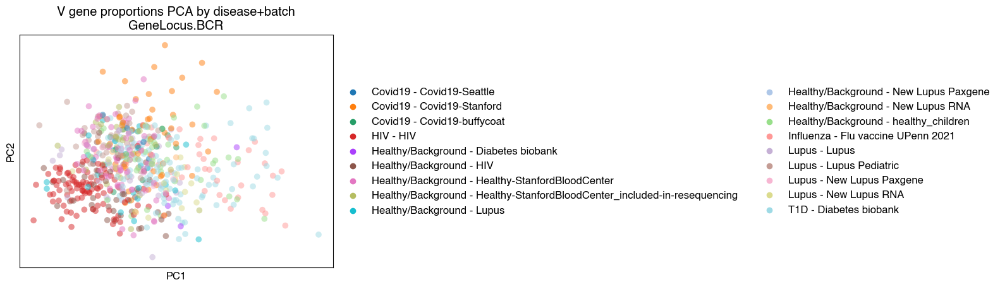

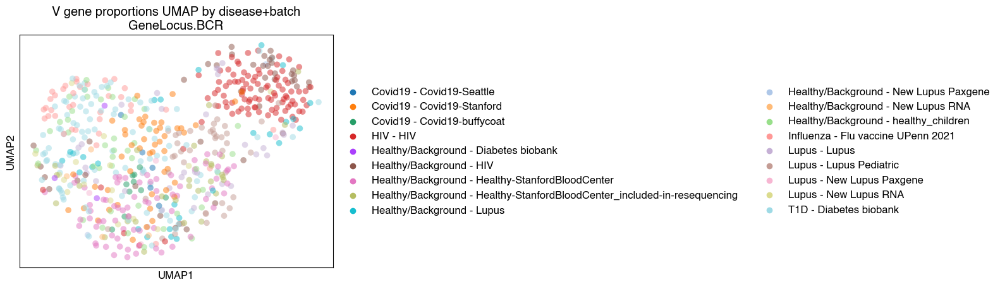

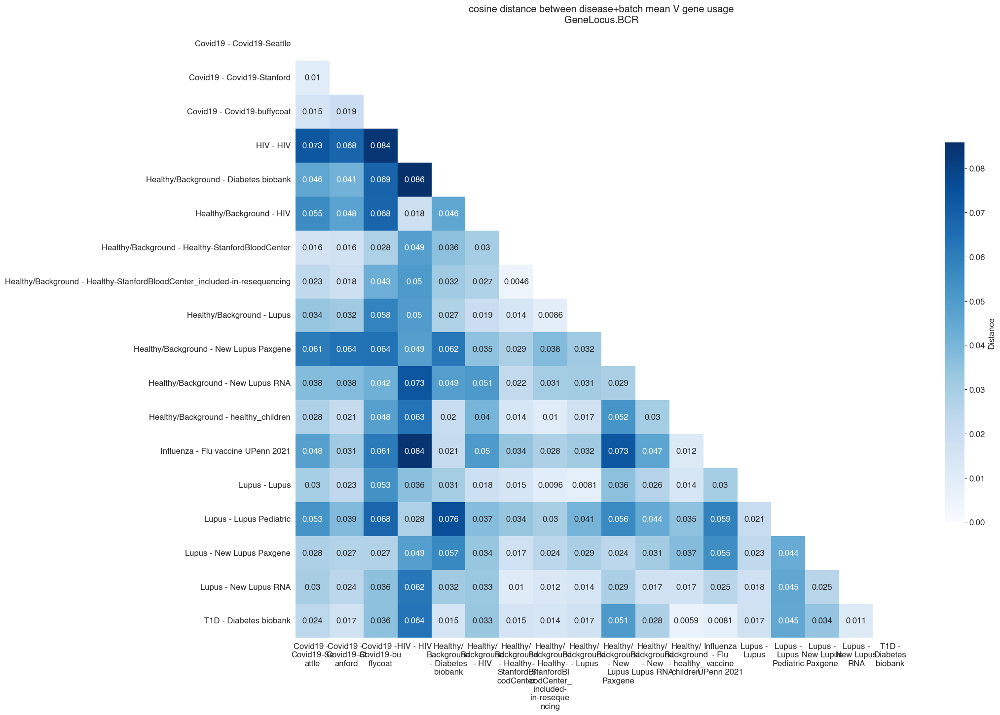

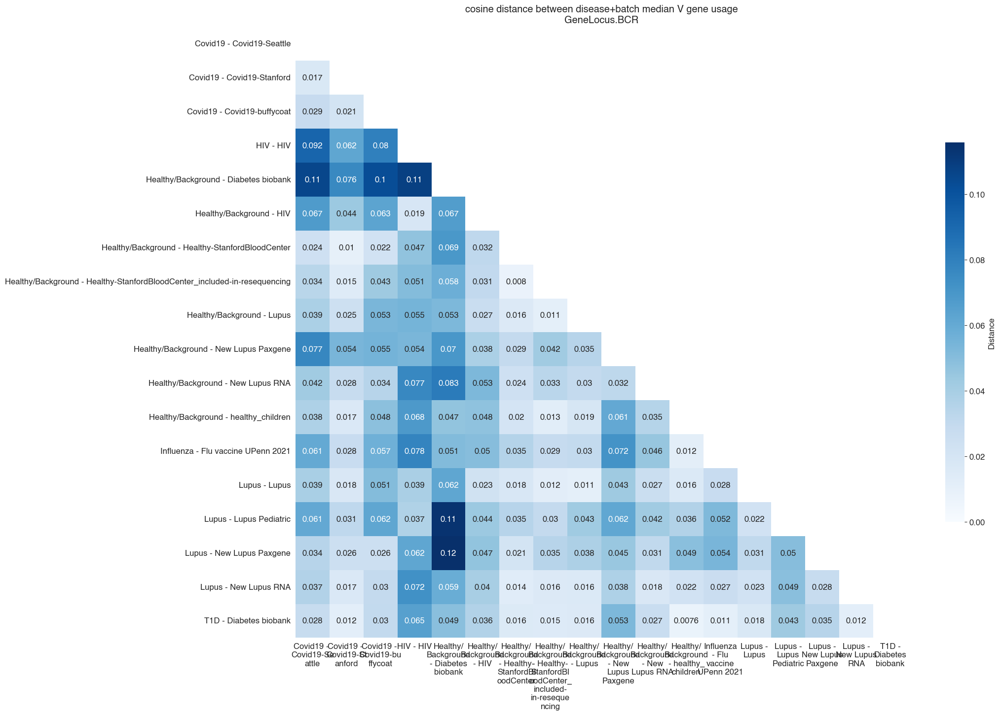

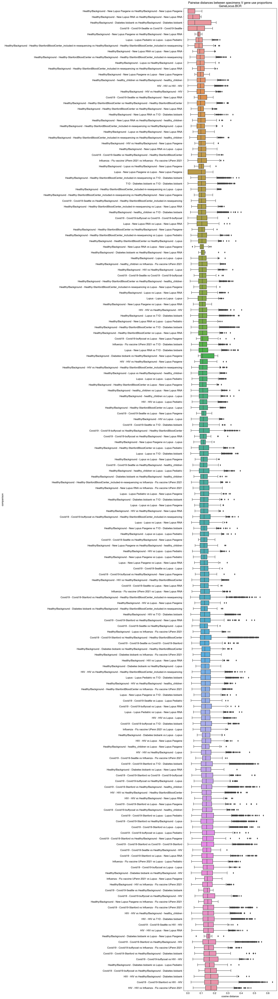

In [38]:
adata_vgene_use_bcr = None
if GeneLocus.BCR in config.gene_loci_used:
    adata_vgene_use_bcr = v_gene_use_plot_by_batch(gene_locus=GeneLocus.BCR)

{"message": "/tmp/ipykernel_3367766/64972007.py:41: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.\n  adata_vgene_use = anndata.AnnData(\n", "time": "2024-02-07T09:15:20.404306"}


{"message": "... storing 'participant_label' as categorical", "time": "2024-02-07T09:15:23.385210"}


{"message": "... storing 'disease' as categorical", "time": "2024-02-07T09:15:23.387972"}


{"message": "... storing 'specimen_time_point' as categorical", "time": "2024-02-07T09:15:23.390447"}


{"message": "... storing 'participant_description' as categorical", "time": "2024-02-07T09:15:23.392678"}


{"message": "... storing 'study_name' as categorical", "time": "2024-02-07T09:15:23.394788"}


{"message": "... storing 'disease_subtype' as categorical", "time": "2024-02-07T09:15:23.397002"}


{"message": "... storing 'sex' as categorical", "time": "2024-02-07T09:15:23.398928"}


{"message": "... storing 'ethnicity_condensed' as categorical", "time": "2024-02-07T09:15:23.401420"}


{"message": "... storing 'age_group' as categorical", "time": "2024-02-07T09:15:23.403928"}


{"message": "... storing 'age_group_binary' as categorical", "time": "2024-02-07T09:15:23.406151"}


{"message": "... storing 'age_group_pediatric' as categorical", "time": "2024-02-07T09:15:23.408372"}


{"message": "... storing 'disease_severity' as categorical", "time": "2024-02-07T09:15:23.410561"}


{"message": "... storing 'symptoms_cmv' as categorical", "time": "2024-02-07T09:15:23.413104"}


{"message": "... storing 'disease.separate_past_exposures' as categorical", "time": "2024-02-07T09:15:23.415503"}


{"message": "... storing 'disease.rollup' as categorical", "time": "2024-02-07T09:15:23.417812"}


{"message": "... storing 'disease_and_batch' as categorical", "time": "2024-02-07T09:15:23.420142"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:23.445173"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:24.307754"}


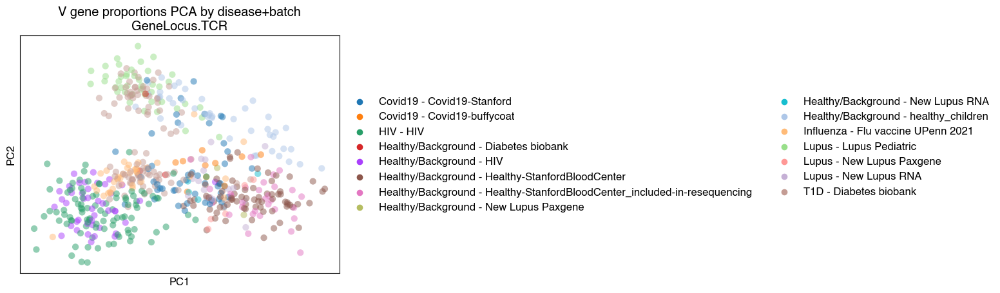

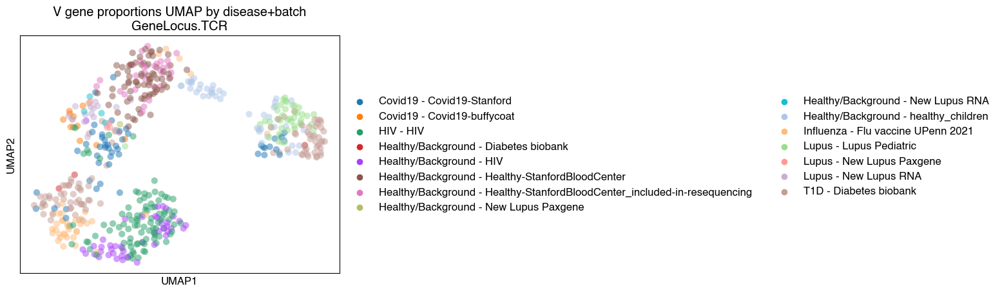

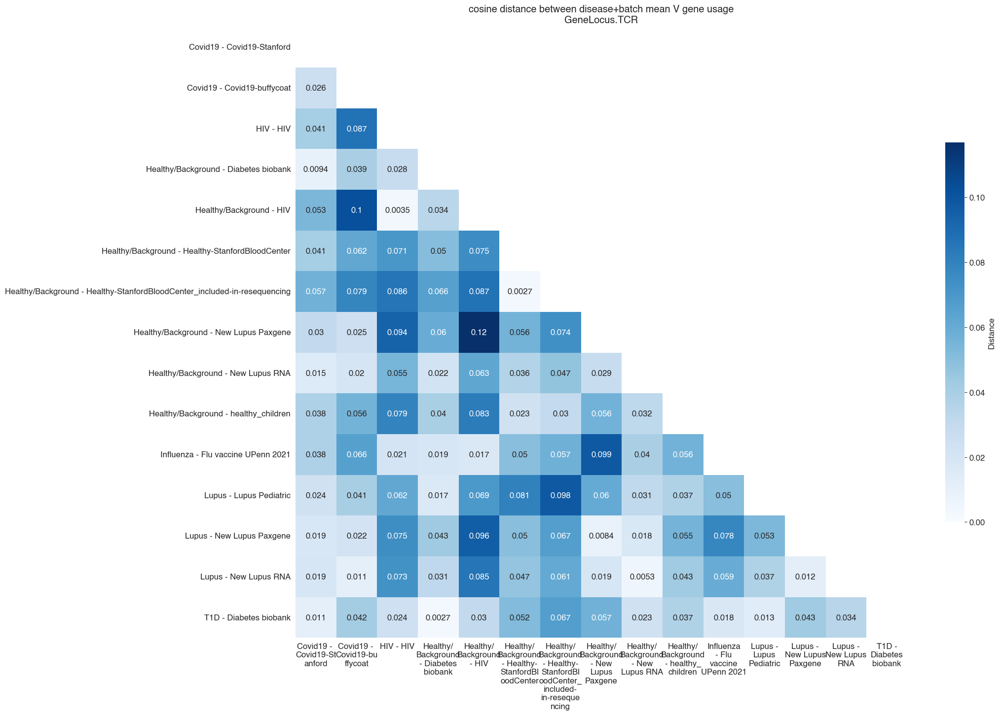

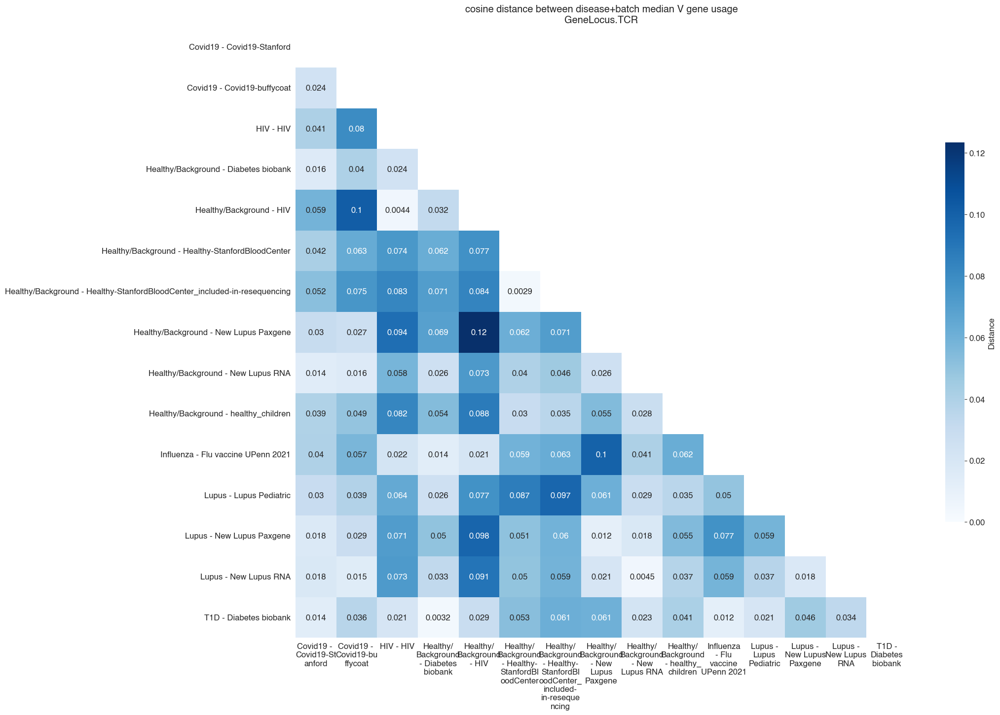

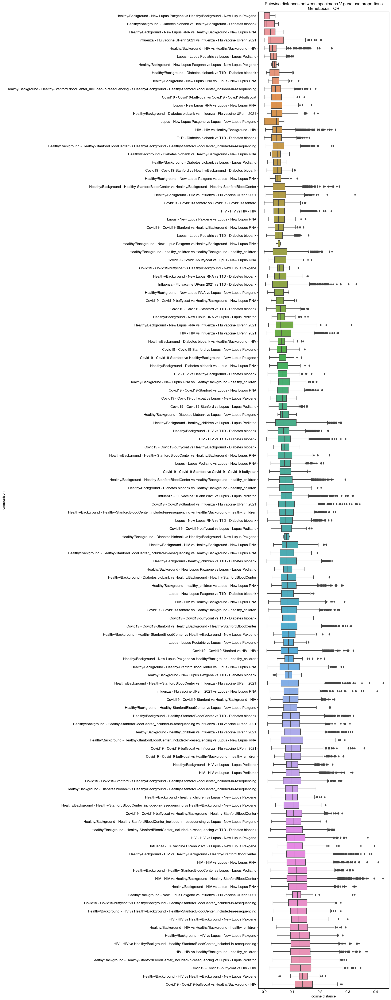

In [39]:
adata_vgene_use_tcr = None
if GeneLocus.TCR in config.gene_loci_used:
    adata_vgene_use_tcr = v_gene_use_plot_by_batch(gene_locus=GeneLocus.TCR)

{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:41.306391"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:41.740521"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:42.830904"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:43.741340"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:44.135655"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:44.866549"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:45.312700"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:46.018807"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:46.354699"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:46.685040"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:47.093939"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:47.946677"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:48.758209"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:49.132588"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:49.848714"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:50.300328"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:50.647554"}


{"message": "/users/maximz/anaconda3/envs/cuda-env-py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored\n  cax = scatter(\n", "time": "2024-02-07T09:15:50.989490"}


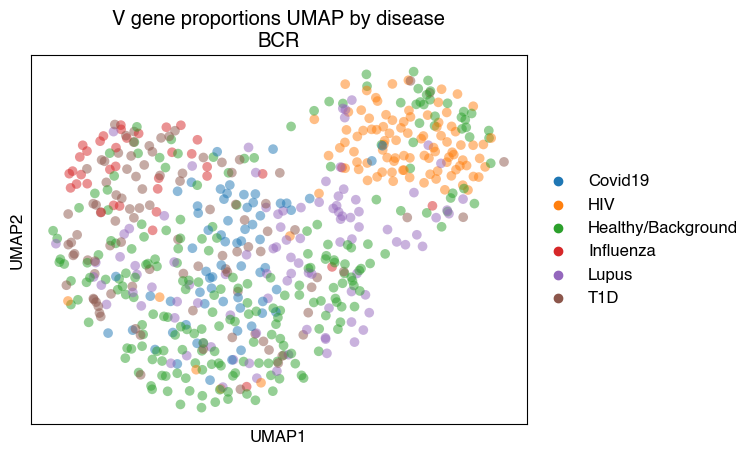

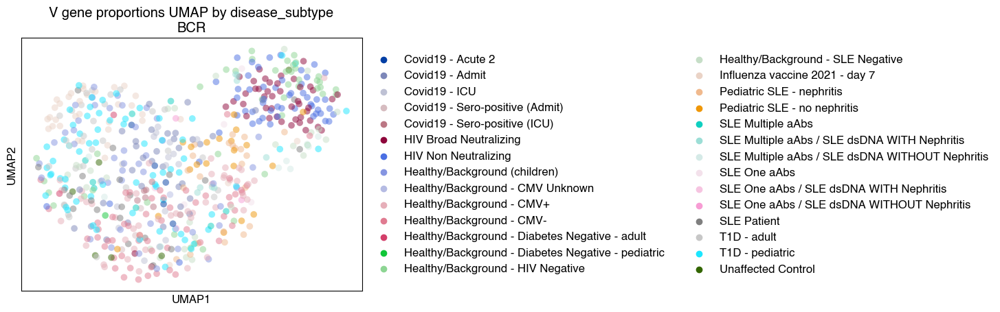

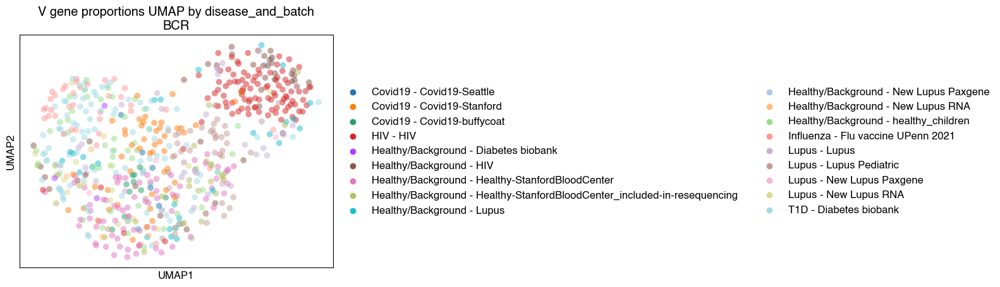

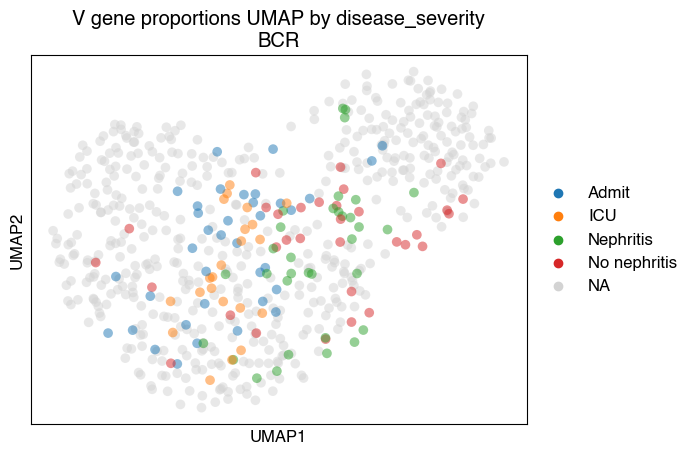

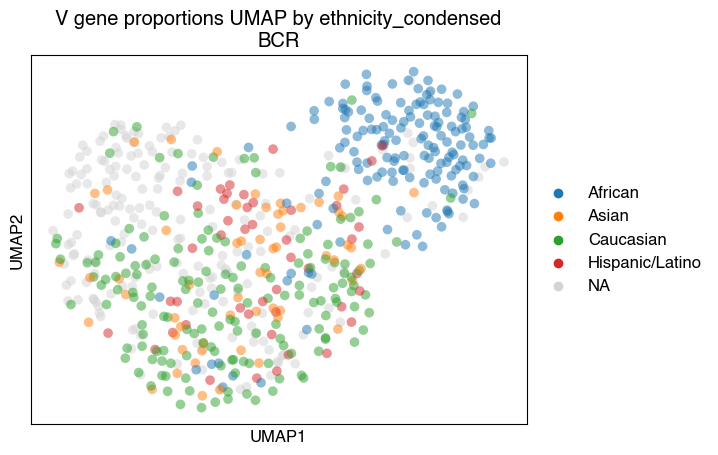

...

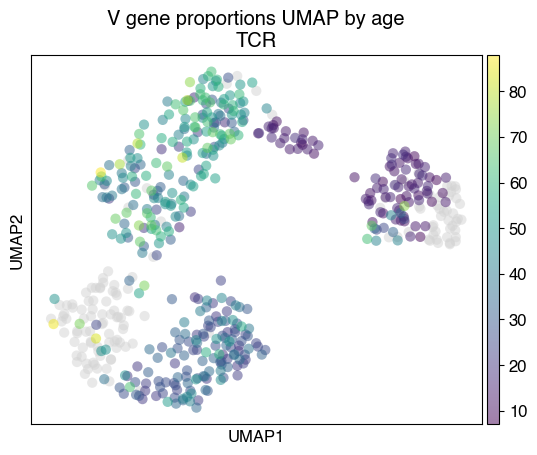

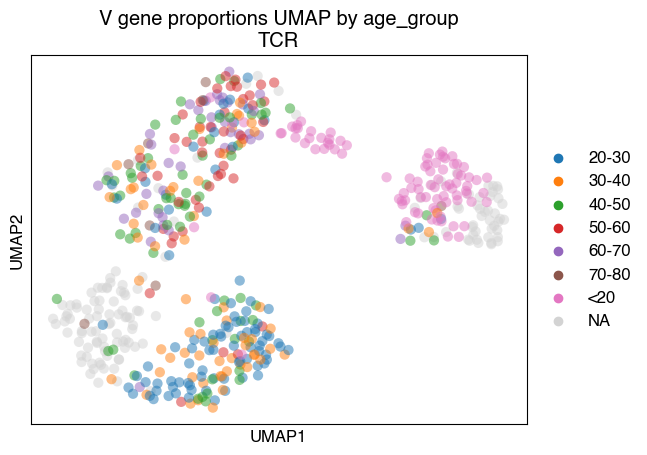

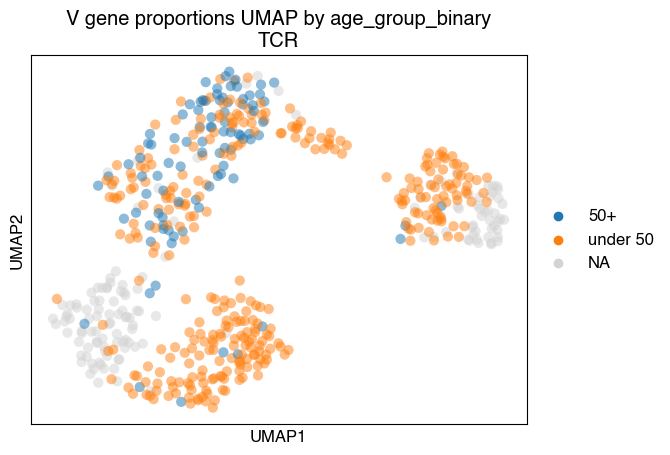

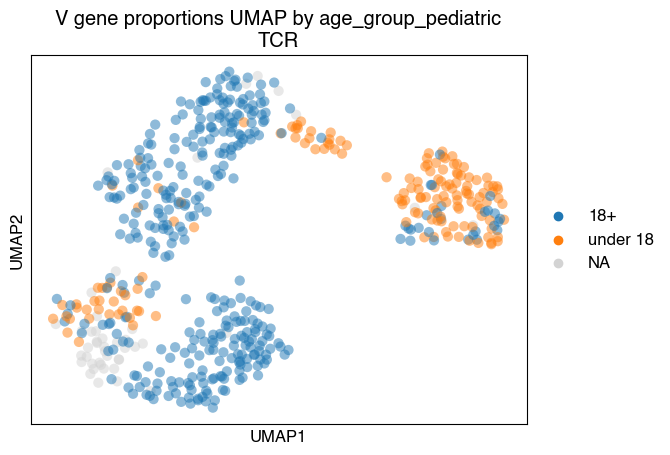

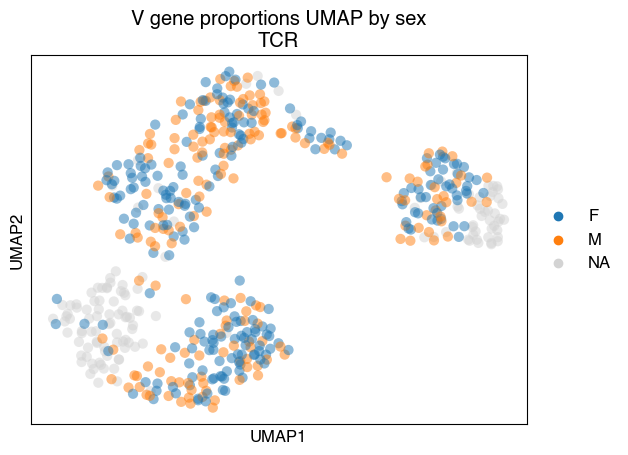

In [40]:
for gene_locus, adata_vgene_use_single_locus in [
    (GeneLocus.BCR, adata_vgene_use_bcr),
    (GeneLocus.TCR, adata_vgene_use_tcr),
]:
    if gene_locus not in config.gene_loci_used:
        continue
    output_dir, highres_output_dir = get_dirs(gene_locus)
    for color in [
        "disease",
        "disease_subtype",
        "disease_and_batch",
        "disease_severity",
        "ethnicity_condensed",
        "age",
        "age_group",
        "age_group_binary",
        "age_group_pediatric",
        "sex",
    ]:
        if adata_vgene_use_single_locus.obs[color].isna().all():
            # Skip all-NaN colors. They cause a plotting bug.
            continue
        fig_umap = sc.pl.umap(
            adata_vgene_use_single_locus,
            color=color,
            alpha=0.5,
            return_fig=True,
            title=f"V gene proportions UMAP by {color}\n{gene_locus.name}",
        )
        genetools.plots.savefig(
            fig_umap,
            highres_output_dir
            / f"v_gene_proportions_by_specimen.umap.color_by_variable.{color}.png",
            dpi=300,
        )